 # Libraries  

In [1]:
#Python libraries
import os
import random
import math
import csv
from google.colab import drive


#Data Visualization 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import cv2 


#Data Manipulation
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,roc_curve,roc_auc_score,classification_report 

#ML
import tensorflow as tf
import tensorflow.keras as keras 
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD,Adam,RMSprop
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.callbacks  import ModelCheckpoint, EarlyStopping
import tensorflow_hub as hub
from tensorflow.keras.models import load_model


 

# Notebook Functions

In [2]:
#function (1) plot recives the path of the files and return a DF 

def from_path_to_df(files,path,label,colData,colLabel,listData,listLabel):

    for f in files:
        listData.append(path+'/'+f)
        listLabel.append(label)
    
    return pd.DataFrame({colData:listData,colLabel:listLabel}) 



In [3]:
#function (2) this function plot a number of images as sample  

def sample_images_files(df,sample,colData,colLabel):
    df_sample =  df.sample(sample)
    cols = 5   #five is the max number of plot in a row
    row = math.ceil(len(df_sample)/cols) 
    
    plt.figure(figsize=(15,15))

    for i,path in enumerate(df_sample[colData]):
    
        plt.subplot(row,cols,i+1)
        imagen = mpimg.imread(path)
        plt.imshow(imagen)
        plt.title(df_sample[colLabel].iloc[i],fontsize=15,weight="bold")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [4]:
#function (3) this function plot a the accuracy and loss from the model history  

def plot_model_history(history,name_model):
  
  fig,axes = plt.subplots(2,1,figsize=(15,10))

  axes[0].plot(history['loss'], 'orange',label="loss")
  axes[0].plot(history['val_loss'], 'b',label = "val_loss")
  plt.xlabel('N. epochs')
  plt.ylabel('loss') 
  axes[0].legend()
  axes[0].set_title("Loss vs Validation Loss",fontsize=12,weight="bold")

  axes[1].plot(history['accuracy'], 'r',label="acc")
  axes[1].plot(history['val_accuracy'], 'g',label="val_acc")
  plt.xlabel('N. Epochs')
  plt.ylabel('accuracy')
  axes[1].legend()
  axes[1].set_title("Accuracy vs Validation Accuracy",fontsize=12,weight="bold")
  plt.suptitle(name_model,fontsize=14,weight="bold")
  plt.show()


In [5]:
#function (4) the model will predict the classes
def y_prediction (model,test):
  y_pred = model.predict(test,verbose=2)
  return np.argmax(y_pred,axis=1)

In [6]:
#function (5) plot the confusion matrix
def confu_matrix (ytest,ypred):
  return confusion_matrix(np.argmax(ytest,axis=1),ypred)

In [7]:
#function (6) plot the confusion matrix 

def plot_conf_matrix(cm_data,title,labels):
  plt.figure(figsize = (5,5))
  sns.heatmap(cm_data,annot=True,annot_kws={'size':12},cmap="YlGnBu",
            xticklabels=labels,yticklabels=labels)
  plt.title(title,weight="bold")
  plt.xlabel("Predicted Class",weight="bold")
  plt.ylabel("Real Class",weight="bold")
  plt.show()  

In [8]:
#function (7) get the classification report, convert 'ypred' from one-hot encoding
#to label and return a the report as DF
def class_report(ytest,ypred,names):
  cr_dict = classification_report(np.argmax(ytest,axis=1),ypred,target_names=names,output_dict=True) 
  return pd.DataFrame(cr_dict).T

# Load Images

In [9]:
#mount google drive
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
#linux command to see the number of files per folder
!ls "/content/drive/My Drive/Barcelona Activa/Itinerario Data Science/Nuwe/TalentSquad-Data-Science-II/train/baseball" | wc -l 
!ls "/content/drive/My Drive/Barcelona Activa/Itinerario Data Science/Nuwe/TalentSquad-Data-Science-II/train/cricket" | wc -l
!ls "/content/drive/My Drive/Barcelona Activa/Itinerario Data Science/Nuwe/TalentSquad-Data-Science-II/train/football" | wc -l

66
81
64


In [11]:
#path file in google drive
dir_train_baseball =  "/content/drive/My Drive/Barcelona Activa/Itinerario Data Science/Nuwe/TalentSquad-Data-Science-II/train/baseball"  
dir_train_cricket = "/content/drive/My Drive/Barcelona Activa/Itinerario Data Science/Nuwe/TalentSquad-Data-Science-II/train/cricket"  
dir_train_football =  "/content/drive/My Drive/Barcelona Activa/Itinerario Data Science/Nuwe/TalentSquad-Data-Science-II/train/football"  
dir_test =  "/content/drive/My Drive/Barcelona Activa/Itinerario Data Science/Nuwe/TalentSquad-Data-Science-II/train/test"  

In [12]:
#list of file names inside the folder with file type.
baseball_train_images = os.listdir(dir_train_baseball)  
cricket_train_images = os.listdir(dir_train_cricket)  
football_train_images = os.listdir(dir_train_football)
test_images = os.listdir(dir_test)

In [13]:
#define the data and label list
baseball_train_data = []
baseball_train_label = []

cricket_train_data = []
cricket_train_label = [] 

football_train_data = []
football_train_label = [] 

In [14]:
#use the function (1) to transform the data to DF

df_baseball = from_path_to_df(baseball_train_images,dir_train_baseball,"Baseball","dirSport",
                "Label",baseball_train_data,baseball_train_label)

df_cricket = from_path_to_df(cricket_train_images,dir_train_cricket,"Cricket","dirSport",
                "Label",cricket_train_data,cricket_train_label)

df_football = from_path_to_df(football_train_images,dir_train_football,"Football","dirSport",
                "Label",football_train_data,football_train_label)

In [15]:
#concat the three DF's
df_train = pd.concat([df_baseball,df_cricket,df_football],ignore_index=True)
df_train.head()

,dirSport,Label
0,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
1,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
2,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
3,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
4,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball


In [16]:
#shuffle the DF files
df_train = df_train.sample(frac = 1, random_state=1).reset_index(drop = True) 
df_train

,dirSport,Label
0,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
1,/content/drive/My Drive/Barcelona Activa/Itine...,Football
2,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
3,/content/drive/My Drive/Barcelona Activa/Itine...,Football
4,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
...,...,...
206,/content/drive/My Drive/Barcelona Activa/Itine...,Football
207,/content/drive/My Drive/Barcelona Activa/Itine...,Cricket
208,/content/drive/My Drive/Barcelona Activa/Itine...,Cricket
209,/content/drive/My Drive/Barcelona Activa/Itine...,Cricket


# EDA

In [17]:
#review the number of images per sport
total_image_label = df_train["Label"].value_counts()
total_image_label  

Cricket     81
Baseball    66
Football    64
Name: Label, dtype: int64

In [18]:
#get the percent by sport of the total images
rel_values = df_train["Label"].value_counts(ascending=False, normalize=True).values * 100
rel_values  

array([38.38862559, 31.27962085, 30.33175355])

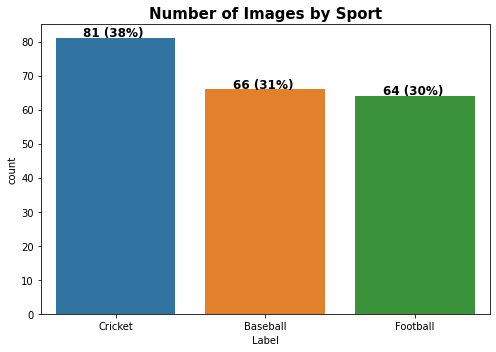

In [19]:
#plot the number of images per sport

plt.figure(figsize=(7,5)) 

ax = sns.countplot(x = df_train["Label"],order=total_image_label.index)

plt.title("Number of Images by Sport",fontsize=15,weight="bold")

total = df_train.shape[0]
 
for i,(text,label,p) in enumerate(zip(ax.patches,total_image_label,rel_values)):
         
        x = text.get_x() + text.get_width() /2  
        y = text.get_y() + text.get_height()  
        ax.annotate("{} ".format(f'{label} ({p:.0f}%)'), (x, y),size=12, weight= 'bold' , xytext=(0, 5),
                   textcoords='offset points',  ha='center', va='center',)


 
plt.tight_layout()


plt.show()

The above plot show us that the cricket folder has the most number of images, the difference with the others folder contents almost 8% of the files total. There is a slight imbalanced number of images in the dataset, I will not use any technique to balance it at first but it will depend on the results to balance the data. 

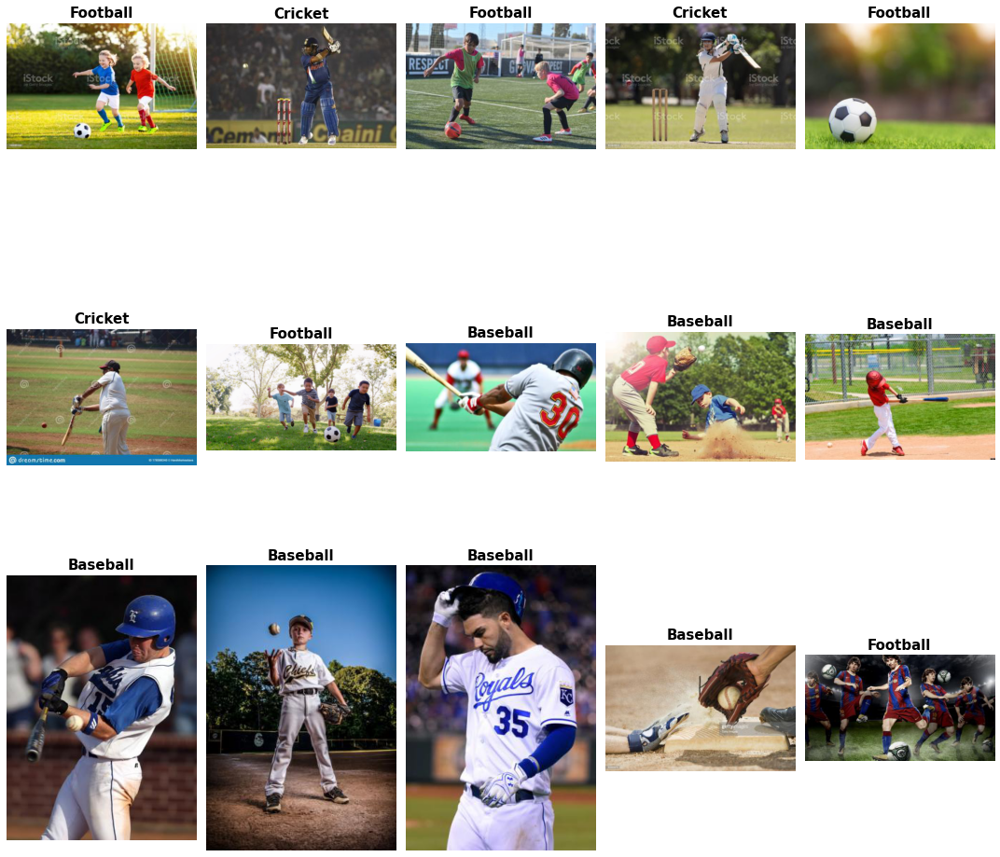

In [20]:
#use the function (2) to get a image sample
sample_images_files(df_train,15,"dirSport","Label")

In the above cell is showed a sample of 15 images and it can be seen that there is no standard size for the images. For the good performance of the model, its necessary to standarize the image size. 

In [21]:
#get the mean of the width and height of the images
widths = []
heights = []

df_sample = df_train.sample(frac=.25)

for i, path in enumerate(df_sample["dirSport"]):
    img = mpimg.imread(path)  
    widths.append(img.shape[0])
    heights.append(img.shape[1])

print("The mean width is {} and heigh is {} pixels.".format(round(np.mean(widths)),(round(np.mean(heights)))))        

The mean width is 291 and heigh is 376 pixels.


# Preprocessing

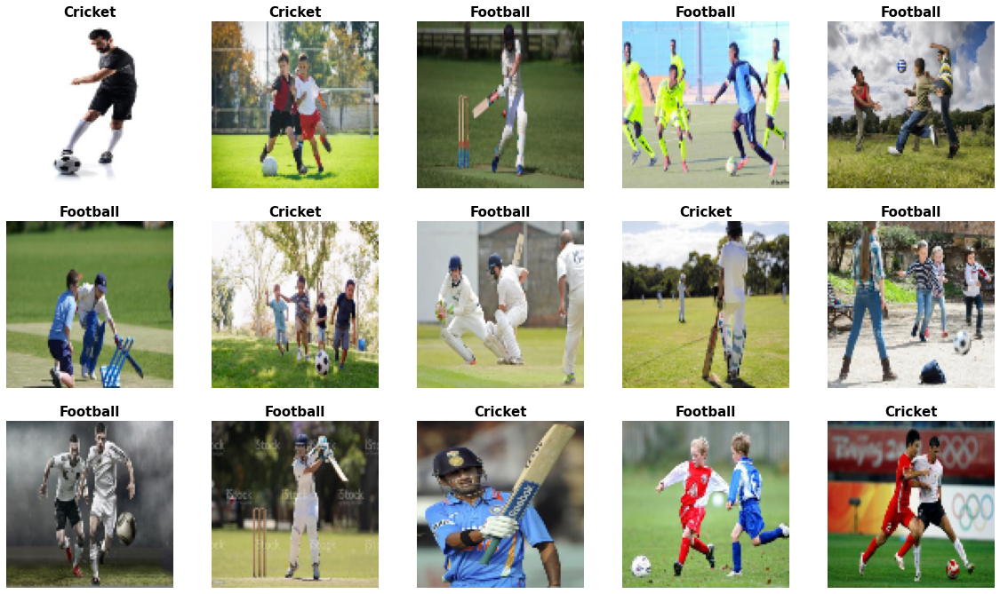

In [22]:
#I will resize the images only for visualization purposes.

img_resize_sample = df_train.sample(15)
img_size=100

plt.figure(figsize=(20,20))

for i, path in enumerate(img_resize_sample["dirSport"][:40].sample(frac=1)):
    img = mpimg.imread(path)  
    img_resize = cv2.resize(img, (img_size, img_size))
    plt.subplot(5, 5, i+1)
    plt.imshow(img_resize)
    plt.title(img_resize_sample["Label"].iloc[i],fontsize=15,weight="bold")
    plt.axis('off')
    
plt.show()

I will resize all the images to a 100x100 (WxH) to get a squared image with a smaller resolution to save time in the model training without too much image details loss. The transfer learning model has a defined size so the images have to be changed to that defined size.

In [23]:
#resize the images for the CNN and transfer learning 

transfer_learning_size = 224
training_images = []
transfer_learning_images = []

for i,path in enumerate(df_train["dirSport"]):  
    img = mpimg.imread(path)   
    img = cv2.resize(img, (img_size, img_size))
    tl_img = cv2.resize(img, (transfer_learning_size, transfer_learning_size))
    label = df_train["Label"].iloc[i]
    training_images.append([img, label])
    transfer_learning_images.append([tl_img, label])

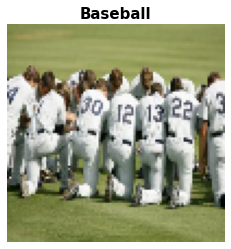

In [24]:
#first image as example of the resized image 

i = random.randint(0,168)

plt.figure(figsize=(4,4))
plt.imshow(training_images[i][0])
plt.title(training_images[i][1],fontsize=15,weight="bold")
plt.axis('off')
plt.show()

In [25]:
#create the variables X and y, the former will contain the data images 
#and the latter the labels  

X = []  
y = []  

for img, labels in training_images:
    X.append(img)
    y.append(labels)


In [26]:
#normalize the data image to get values from 0-1
X = np.array(X).astype(float) / 255
X[0][0]

array([[0.36862745, 0.2627451 , 0.19607843],
       [0.37254902, 0.26666667, 0.2       ],
       [0.37647059, 0.27058824, 0.20392157],
       [0.38431373, 0.27843137, 0.21176471],
       [0.37647059, 0.2745098 , 0.20784314],
       [0.39215686, 0.28627451, 0.21176471],
       [0.41960784, 0.30980392, 0.22745098],
       [0.45490196, 0.33333333, 0.25098039],
       [0.41960784, 0.29803922, 0.21568627],
       [0.39607843, 0.2745098 , 0.19215686],
       [0.40392157, 0.27843137, 0.2       ],
       [0.39215686, 0.27058824, 0.18823529],
       [0.41568627, 0.29019608, 0.20784314],
       [0.41568627, 0.29019608, 0.20784314],
       [0.41568627, 0.29019608, 0.20784314],
       [0.41960784, 0.29411765, 0.21176471],
       [0.41960784, 0.29411765, 0.20392157],
       [0.42352941, 0.29803922, 0.20784314],
       [0.43921569, 0.31372549, 0.22352941],
       [0.45882353, 0.33333333, 0.24313725],
       [0.46666667, 0.34117647, 0.25098039],
       [0.45098039, 0.3254902 , 0.23529412],
       [0.

In [27]:
#image array shape 
X.shape

(211, 100, 100, 3)

The total of the images is 211 (between baseball, cricket and football) the with a size of 100x100 (WxH) with 3 chanel (color).  

In [28]:
#encode the labels to int

le = LabelEncoder()
y = np.array(y).reshape(-1, 1)
y= le.fit_transform(y.ravel())
y

array([0, 2, 0, 2, 0, 1, 0, 2, 2, 1, 1, 0, 0, 0, 0, 2, 2, 1, 0, 0, 0, 0,
       1, 2, 0, 2, 0, 1, 0, 1, 1, 1, 2, 0, 0, 1, 2, 1, 0, 2, 0, 2, 1, 2,
       1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 0, 2, 2, 0, 2, 1, 0, 1, 2, 0, 2,
       0, 2, 0, 1, 2, 1, 1, 0, 0, 0, 2, 2, 0, 2, 1, 2, 0, 1, 1, 1, 1, 2,
       2, 0, 2, 1, 2, 2, 2, 1, 2, 1, 0, 2, 1, 2, 2, 0, 1, 1, 0, 2, 2, 2,
       1, 2, 2, 1, 2, 1, 0, 1, 2, 0, 1, 1, 2, 0, 2, 2, 1, 0, 2, 1, 1, 0,
       0, 1, 1, 2, 1, 1, 0, 0, 1, 1, 2, 1, 1, 0, 1, 0, 2, 1, 2, 1, 1, 2,
       0, 0, 0, 2, 1, 1, 0, 0, 1, 0, 0, 0, 2, 0, 2, 1, 2, 0, 1, 1, 2, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 1, 0, 1, 2, 2, 1, 1, 1, 0, 2,
       0, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 0])

In [29]:
#convert the integers  to binary class matrix.
y = to_categorical(y,3)
y[0] 

array([1., 0., 0.], dtype=float32)

# Train-Test Split

In [30]:
#split the data to train and test
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=7)

In [31]:
#train and test shapes
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((168, 100, 100, 3), (43, 100, 100, 3), (168, 3), (43, 3))

# Building the CNN Model

The number of images to train the model with is small so image aumentation will be used, thus enlarging the size of the dataset.  The images will be rotated, shifted in width and height, sheared, zoomed and flipped.

## Data Augmentation

In [160]:
#data augmentation techniques to be used
data_image_generation = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.25,
    height_shift_range=0.25,
    shear_range=0.5,
    zoom_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True
)

data_image_generation.fit(X_train)

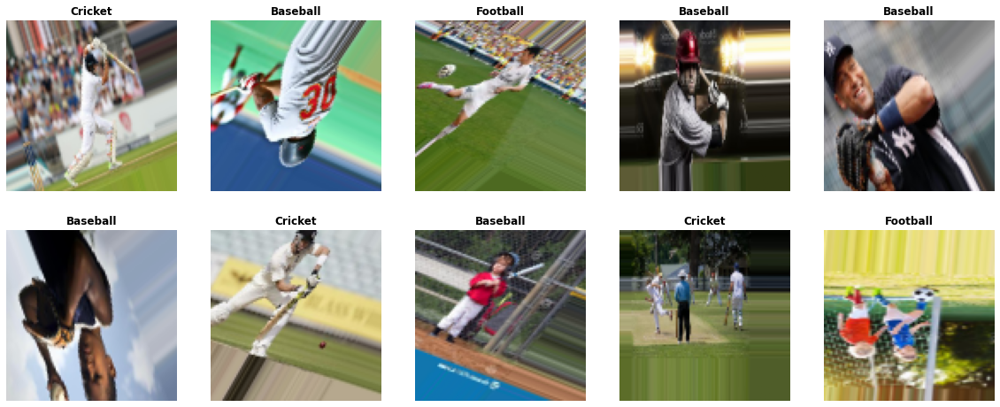

In [161]:
#sample of the data image generated
 

class_labels = ["Baseball","Cricket","Football"]

 

plt.figure(figsize=(20,8))

for img, label in data_image_generation.flow(X_train, y_train, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(img[i] )
    plt.title(class_labels[np.argmax(label[i])],fontsize=12,weight="bold")
    plt.axis('off')
  break

## Build Model 1 

In [288]:
#Build the model

modelCNN = Sequential([
keras.layers.Conv2D(32, (3,3), activation='relu',padding='same' ,input_shape=X_train.shape[1:]),
   
keras.layers.Conv2D(32, (3,3), activation='relu',padding='same' ),
keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
keras.layers.Dropout(0.5),

keras.layers.Conv2D(64, (3,3), activation='relu',padding='same' ),
    
keras.layers.Conv2D(64, (3,3), activation='relu',padding='same' ),
keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
keras.layers.Dropout(0.5),

keras.layers.Conv2D(128, (3,3), activation='relu',padding='same' ),
keras.layers.Conv2D(128, (3,3), activation='relu',padding='same' ),
keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
keras.layers.Dropout(0.5),

keras.layers.Conv2D(256, (3,3), activation='relu',padding='same' ),   
keras.layers.Conv2D(256, (3,3), activation='relu',padding='same' ),
keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
keras.layers.Dropout(0.5),
  
keras.layers.Flatten(),   
keras.layers.Dense(512, activation='relu'),
keras.layers.Dense(3, activation='softmax')
])


In [163]:
#summary of the model
modelCNN.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 100, 100, 32)      896       
                                                                 
 conv2d_29 (Conv2D)          (None, 100, 100, 32)      9248      
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 50, 50, 32)       0         
 g2D)                                                            
                                                                 
 dropout_20 (Dropout)        (None, 50, 50, 32)        0         
                                                                 
 conv2d_30 (Conv2D)          (None, 50, 50, 64)        18496     
                                                                 
 conv2d_31 (Conv2D)          (None, 50, 50, 64)        36928     
                                                      

## Build Model 2 

In [164]:
#Build the model

modelCNN2 = Sequential([
  keras.layers.Conv2D(64, (3,3), activation='relu',padding='same' ,input_shape=X_train.shape[1:]),
  keras.layers.Conv2D(64, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),

  keras.layers.Conv2D(128, (3,3), activation='relu',padding='same' ),  
  keras.layers.Conv2D(128, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
   
  keras.layers.Conv2D(256, (3,3), activation='relu',padding='same' ),
  keras.layers.Conv2D(256, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),

  keras.layers.Conv2D(512, (3,3), activation='relu',padding='same' ),
  keras.layers.Conv2D(512, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),
 
  keras.layers.Flatten(),   
  keras.layers.Dense(512, activation='relu'),
  keras.layers.Dense(3, activation='softmax')
])

In [165]:
#summary of the model
modelCNN2.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 100, 100, 64)      1792      
                                                                 
 conv2d_37 (Conv2D)          (None, 100, 100, 64)      36928     
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 50, 50, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_38 (Conv2D)          (None, 50, 50, 128)       73856     
                                                                 
 conv2d_39 (Conv2D)          (None, 50, 50, 128)       147584    
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 25, 25, 128)      0         
 g2D)                                                 

## Build Model 3 

In [289]:
#Build the model

modelCNN3 = Sequential([
  keras.layers.Conv2D(32, (3,3), activation='relu',padding='same' ,input_shape=X_train.shape[1:]),
  keras.layers.Conv2D(32, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),

  keras.layers.Conv2D(64, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),

  keras.layers.Conv2D(128, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),
 
  keras.layers.Flatten(), 
  keras.layers.Dense(512, activation='relu'),
  keras.layers.Dropout(0.5),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dropout(0.5),
  keras.layers.Dense(3, activation='softmax')
])

In [167]:
#summary of the model
modelCNN3.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_44 (Conv2D)          (None, 100, 100, 32)      896       
                                                                 
 conv2d_45 (Conv2D)          (None, 100, 100, 32)      9248      
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 50, 50, 32)       0         
 g2D)                                                            
                                                                 
 dropout_25 (Dropout)        (None, 50, 50, 32)        0         
                                                                 
 conv2d_46 (Conv2D)          (None, 50, 50, 64)        18496     
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 25, 25, 64)       0         
 g2D)                                                 

## Build Model 4 

In [168]:
#Build the model

modelCNN4 = Sequential([
  keras.layers.Conv2D(32, (3,3), activation='relu',padding='same' ,input_shape=X_train.shape[1:]),
  keras.layers.Conv2D(32, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),

  keras.layers.Conv2D(64, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),

  keras.layers.Conv2D(128, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),
 
  keras.layers.Flatten(), 
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dropout(0.5),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dropout(0.5),
  keras.layers.Dense(3, activation='softmax')
])

In [169]:
#summary of the model
modelCNN4.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 100, 100, 32)      896       
                                                                 
 conv2d_49 (Conv2D)          (None, 100, 100, 32)      9248      
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 50, 50, 32)       0         
 g2D)                                                            
                                                                 
 dropout_30 (Dropout)        (None, 50, 50, 32)        0         
                                                                 
 conv2d_50 (Conv2D)          (None, 50, 50, 64)        18496     
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 25, 25, 64)       0         
 g2D)                                                 

## Build Model 5 

In [170]:
#Build the model

modelCNN5 = Sequential([
  keras.layers.Conv2D(32, (3,3), activation='relu',padding='same' ,input_shape=X_train.shape[1:]),
  keras.layers.Conv2D(32, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),

  keras.layers.Conv2D(64, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),

  keras.layers.Conv2D(128, (3,3), activation='relu',padding='same' ),
  keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)),
  keras.layers.Dropout(0.5),
 
  keras.layers.Flatten(), 
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dropout(0.5),
  keras.layers.Dense(64, activation='relu'),
  keras.layers.Dropout(0.5),
  keras.layers.Dense(3, activation='softmax')
])

In [171]:
#summary of the model
modelCNN5.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_52 (Conv2D)          (None, 100, 100, 32)      896       
                                                                 
 conv2d_53 (Conv2D)          (None, 100, 100, 32)      9248      
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 50, 50, 32)       0         
 g2D)                                                            
                                                                 
 dropout_35 (Dropout)        (None, 50, 50, 32)        0         
                                                                 
 conv2d_54 (Conv2D)          (None, 50, 50, 64)        18496     
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 25, 25, 64)       0         
 g2D)                                                

## Define Error function 

In [291]:
#define the optimizer and learning rate  
opt_Adam = Adam(learning_rate=.0001)


modelCNN.compile(loss='categorical_crossentropy', optimizer=opt_Adam, metrics=['accuracy'])
modelCNN2.compile(loss='categorical_crossentropy', optimizer=opt_Adam, metrics=['accuracy'])
modelCNN3.compile(loss='categorical_crossentropy', optimizer=opt_Adam, metrics=['accuracy'])
modelCNN4.compile(loss='categorical_crossentropy', optimizer=opt_Adam, metrics=['accuracy'])
modelCNN5.compile(loss='categorical_crossentropy', optimizer=opt_Adam, metrics=['accuracy'])

In [173]:
#feed the model with a batch size of 8 to run over all the 168 files 
batch_size= 8

data_gen_train = data_image_generation.flow(X_train, y_train, batch_size=batch_size)

The aim of use EarlyStopping is that training is stopped when a monitored metric has stopped improving in this case the goal is to minimize model loss.

In [174]:
#earlyStoping line  
earlyStopping = EarlyStopping(monitor='loss', min_delta=0, patience=20, verbose=1, mode='auto')

In [175]:
#load the colab tensorboard extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## Run Model 1

In [176]:
#define the path to log created by tensonboard
logCNN = TensorBoard(log_dir='logs/cnn') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN]

history_1 = modelCNN.fit(
    data_gen_train,
    epochs=500, batch_size=batch_size,
    validation_data=(X_test, y_test),
    steps_per_epoch= X_train.shape[0]//batch_size,
    validation_steps= y_test.shape[0]//batch_size,
    shuffle= True,
    callbacks = callback_list

)

Epoch 1/500
21/21 [==============================] - 1s 36ms/step - loss: 1.1154 - accuracy: 0.3690 - val_loss: 1.0996 - val_accuracy: 0.3000
Epoch 2/500
21/21 [==============================] - 1s 25ms/step - loss: 1.1052 - accuracy: 0.3988 - val_loss: 1.0980 - val_accuracy: 0.3750
Epoch 3/500
21/21 [==============================] - 1s 24ms/step - loss: 1.0972 - accuracy: 0.3929 - val_loss: 1.0980 - val_accuracy: 0.3750
Epoch 4/500
21/21 [==============================] - 1s 25ms/step - loss: 1.1029 - accuracy: 0.3869 - val_loss: 1.0985 - val_accuracy: 0.3750
Epoch 5/500
21/21 [==============================] - 1s 25ms/step - loss: 1.0917 - accuracy: 0.3869 - val_loss: 1.0974 - val_accuracy: 0.3750
Epoch 6/500
21/21 [==============================] - 1s 24ms/step - loss: 1.0952 - accuracy: 0.4107 - val_loss: 1.0977 - val_accuracy: 0.4250
Epoch 7/500
21/21 [==============================] - 1s 25ms/step - loss: 1.0941 - accuracy: 0.4345 - val_loss: 1.0967 - val_accuracy: 0.4250
Epoch 

In [177]:
#the model history is a dictionary with the values of loss, accuracy,
#validation loss and acuraccy
history_1.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

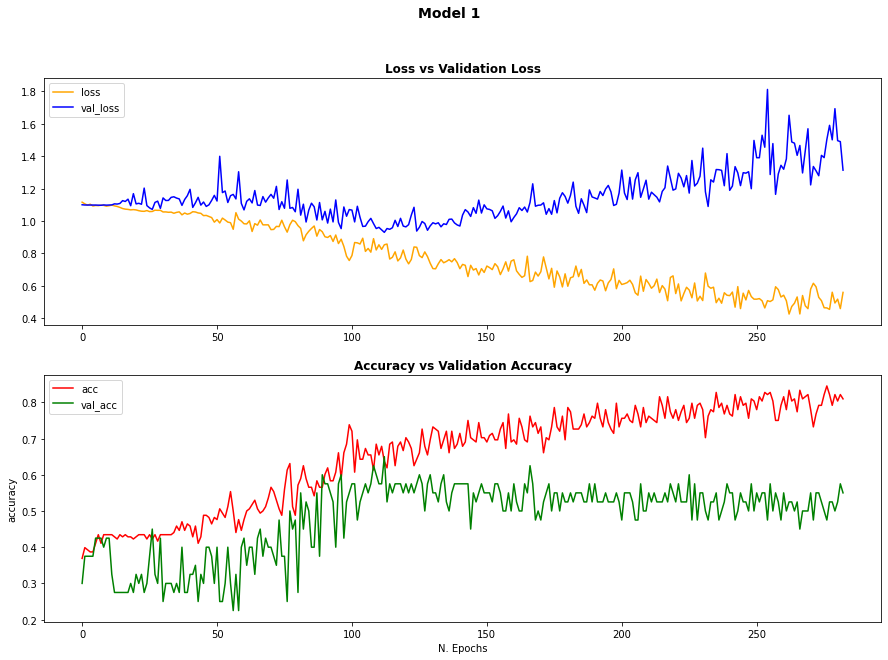

In [178]:
#use the function (3) to plot the accuracy and loss of the model  
plot_model_history(history_1.history,"Model 1")

This model seems to be a bit overfitted, its loss is decreasing, its accuracy is increasing, for its validation its loss is increasing and its accuracy is increase a little and it stopped.

## Run Model 2

In [179]:
#define the path to log created by tensonboard
logCNN2 = TensorBoard(log_dir='logs/cnn2') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN2]

history_2 = modelCNN2.fit(
    data_gen_train,
    epochs=500, batch_size=batch_size,
    validation_data=(X_test, y_test),
    steps_per_epoch= X_train.shape[0]//batch_size,
    validation_steps= y_test.shape[0]//batch_size,
    shuffle= True,
    callbacks = callback_list

)

Epoch 1/500
21/21 [==============================] - 2s 44ms/step - loss: 1.1299 - accuracy: 0.3988 - val_loss: 1.0910 - val_accuracy: 0.3750
Epoch 2/500
21/21 [==============================] - 1s 34ms/step - loss: 1.0953 - accuracy: 0.3869 - val_loss: 1.0918 - val_accuracy: 0.3750
Epoch 3/500
21/21 [==============================] - 1s 34ms/step - loss: 1.0943 - accuracy: 0.3869 - val_loss: 1.0899 - val_accuracy: 0.3750
Epoch 4/500
21/21 [==============================] - 1s 34ms/step - loss: 1.0933 - accuracy: 0.3869 - val_loss: 1.0975 - val_accuracy: 0.3750
Epoch 5/500
21/21 [==============================] - 1s 33ms/step - loss: 1.0893 - accuracy: 0.4167 - val_loss: 1.0793 - val_accuracy: 0.4250
Epoch 6/500
21/21 [==============================] - 1s 34ms/step - loss: 1.0769 - accuracy: 0.4345 - val_loss: 1.1209 - val_accuracy: 0.4250
Epoch 7/500
21/21 [==============================] - 1s 34ms/step - loss: 1.0832 - accuracy: 0.3988 - val_loss: 1.0943 - val_accuracy: 0.3750
Epoch 

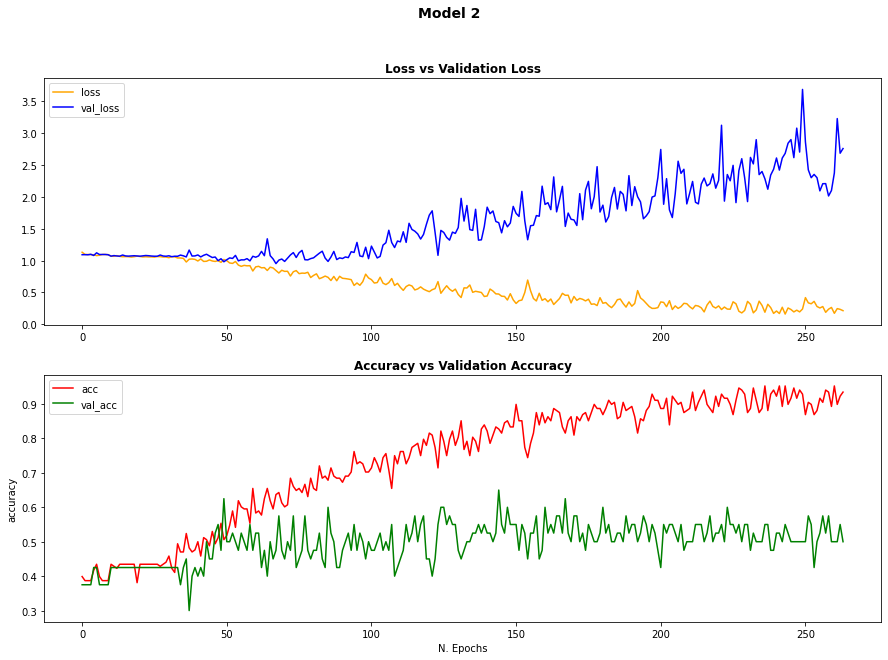

In [180]:
#use the function (3) to plot the accuracy and loss of the model    
plot_model_history(history_2.history,"Model 2")

This model has similar results to the previous one. 

## Run Model 3

In [292]:
#define the path to log created by tensonboard
logCNN3 = TensorBoard(log_dir='logs/cnn3') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN3]

history_3 = modelCNN3.fit(
    data_gen_train,
    epochs=500, batch_size=batch_size,
    validation_data=(X_test, y_test),
    steps_per_epoch= X_train.shape[0]//batch_size,
    validation_steps= y_test.shape[0]//batch_size,
    shuffle= True,
    callbacks = callback_list

)

Epoch 1/500
21/21 [==============================] - 3s 36ms/step - loss: 1.2263 - accuracy: 0.3810 - val_loss: 1.1000 - val_accuracy: 0.2750
Epoch 2/500
21/21 [==============================] - 1s 26ms/step - loss: 1.2398 - accuracy: 0.3452 - val_loss: 1.0983 - val_accuracy: 0.4250
Epoch 3/500
21/21 [==============================] - 1s 28ms/step - loss: 1.1459 - accuracy: 0.3869 - val_loss: 1.0978 - val_accuracy: 0.4250
Epoch 4/500
21/21 [==============================] - 1s 51ms/step - loss: 1.1116 - accuracy: 0.3155 - val_loss: 1.0953 - val_accuracy: 0.3750
Epoch 5/500
21/21 [==============================] - 1s 57ms/step - loss: 1.1128 - accuracy: 0.3274 - val_loss: 1.0950 - val_accuracy: 0.3750
Epoch 6/500
21/21 [==============================] - 1s 29ms/step - loss: 1.0919 - accuracy: 0.4226 - val_loss: 1.0959 - val_accuracy: 0.3750
Epoch 7/500
21/21 [==============================] - 1s 26ms/step - loss: 1.0877 - accuracy: 0.3810 - val_loss: 1.0962 - val_accuracy: 0.3750
Epoch 

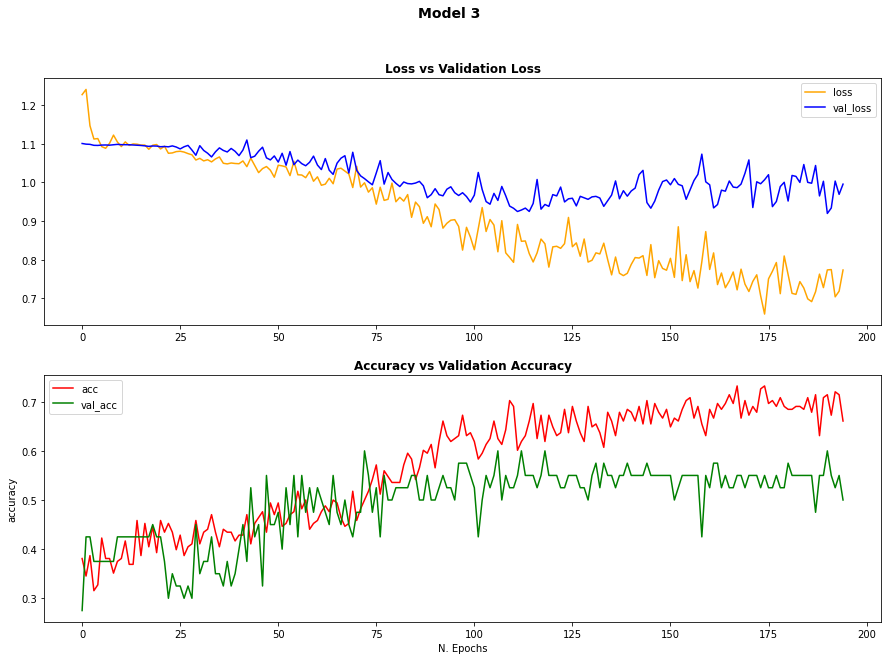

In [301]:
#use the function (3) to plot the accuracy and loss of the model   
plot_model_history(history_3.history,"Model 3")

This model performs better, both training and validation losses seem to be going down but they are separating. In its accuracy it seems to go uphill together but in its validation it stops going uphill.  It has an overfit.

## Run Model 4

In [183]:
#define the path to log created by tensonboard
logCNN4 = TensorBoard(log_dir='logs/cnn4') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN4]

history_4 = modelCNN4.fit(
    data_gen_train,
    epochs=500, batch_size=batch_size,
    validation_data=(X_test, y_test),
    steps_per_epoch= X_train.shape[0]//batch_size,
    validation_steps= y_test.shape[0]//batch_size,
    shuffle= True,
    callbacks = callback_list

)

Epoch 1/500
21/21 [==============================] - 1s 34ms/step - loss: 1.2499 - accuracy: 0.3571 - val_loss: 1.0944 - val_accuracy: 0.3750
Epoch 2/500
21/21 [==============================] - 1s 27ms/step - loss: 1.1043 - accuracy: 0.3333 - val_loss: 1.0961 - val_accuracy: 0.3750
Epoch 3/500
21/21 [==============================] - 1s 24ms/step - loss: 1.0939 - accuracy: 0.3988 - val_loss: 1.0963 - val_accuracy: 0.3750
Epoch 4/500
21/21 [==============================] - 1s 26ms/step - loss: 1.0972 - accuracy: 0.3750 - val_loss: 1.0954 - val_accuracy: 0.3750
Epoch 5/500
21/21 [==============================] - 1s 26ms/step - loss: 1.0895 - accuracy: 0.3929 - val_loss: 1.0948 - val_accuracy: 0.3750
Epoch 6/500
21/21 [==============================] - 1s 25ms/step - loss: 1.0954 - accuracy: 0.3750 - val_loss: 1.0956 - val_accuracy: 0.3750
Epoch 7/500
21/21 [==============================] - 1s 24ms/step - loss: 1.1015 - accuracy: 0.3869 - val_loss: 1.0965 - val_accuracy: 0.3750
Epoch 

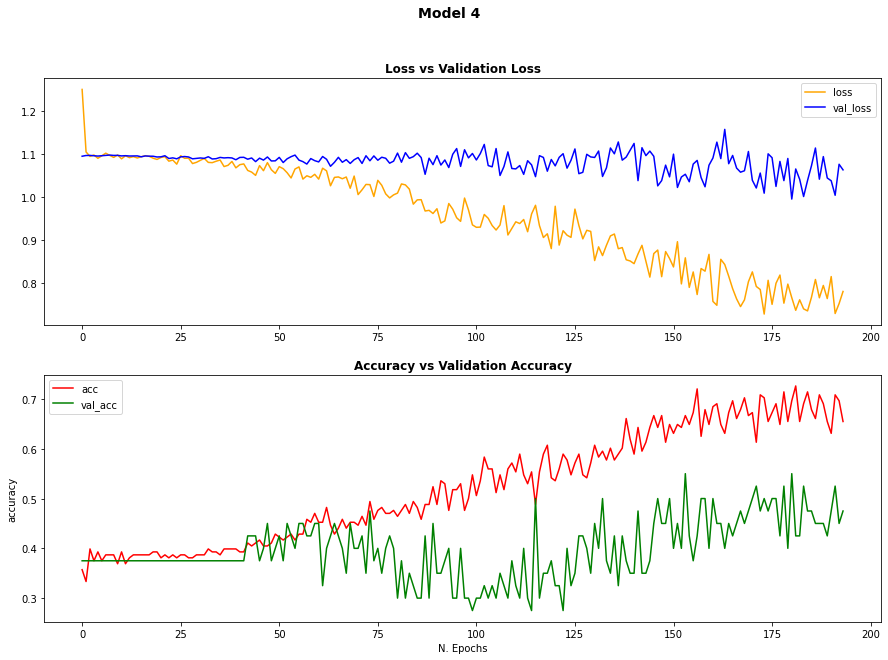

In [184]:
#use the function (3) to plot the accuracy and loss of the model    
plot_model_history(history_4.history,"Model 4")

This model is very similar to model 1 and 2

## Run Model 5

In [185]:
#define the path to log created by tensonboard
logCNN5 = TensorBoard(log_dir='logs/cnn5') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN5]

history_5 = modelCNN5.fit(
    data_gen_train,
    epochs=500, batch_size=batch_size,
    validation_data=(X_test, y_test),
    steps_per_epoch= X_train.shape[0]//batch_size,
    validation_steps= y_test.shape[0]//batch_size,
    shuffle= True,
    callbacks = callback_list

)

Epoch 1/500
21/21 [==============================] - 1s 33ms/step - loss: 1.2544 - accuracy: 0.3095 - val_loss: 1.0984 - val_accuracy: 0.3500
Epoch 2/500
21/21 [==============================] - 1s 23ms/step - loss: 1.0968 - accuracy: 0.4048 - val_loss: 1.0959 - val_accuracy: 0.3750
Epoch 3/500
21/21 [==============================] - 1s 26ms/step - loss: 1.1032 - accuracy: 0.3929 - val_loss: 1.0967 - val_accuracy: 0.3750
Epoch 4/500
21/21 [==============================] - 1s 24ms/step - loss: 1.1017 - accuracy: 0.3333 - val_loss: 1.0969 - val_accuracy: 0.3750
Epoch 5/500
21/21 [==============================] - 1s 26ms/step - loss: 1.0886 - accuracy: 0.4226 - val_loss: 1.0955 - val_accuracy: 0.3750
Epoch 6/500
21/21 [==============================] - 1s 24ms/step - loss: 1.0957 - accuracy: 0.3512 - val_loss: 1.0967 - val_accuracy: 0.3750
Epoch 7/500
21/21 [==============================] - 1s 26ms/step - loss: 1.0916 - accuracy: 0.3631 - val_loss: 1.0960 - val_accuracy: 0.3750
Epoch 

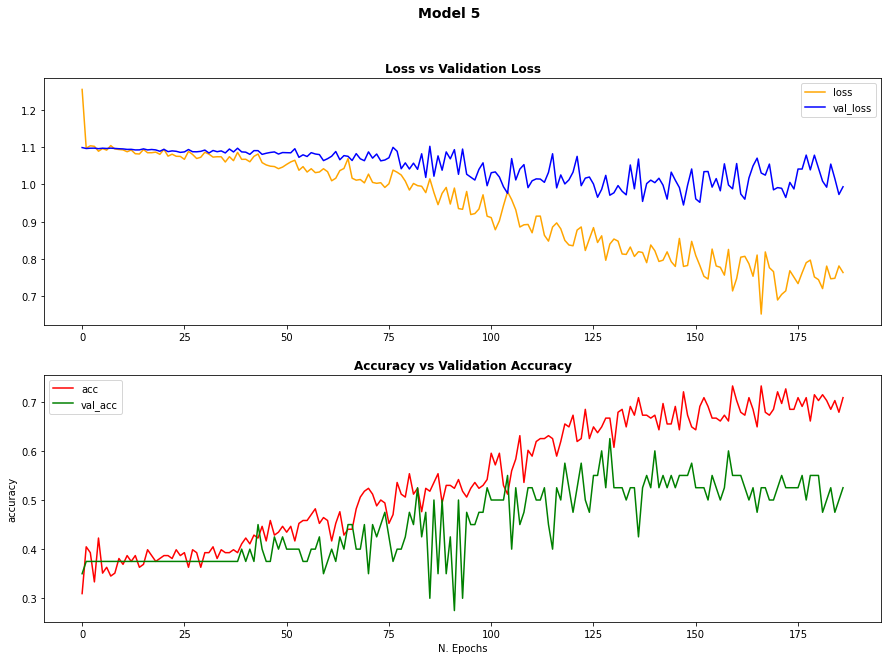

In [186]:
#use the function (3) to plot the accuracy and loss of the model   
plot_model_history(history_5.history,"Model 5")

This model is very similar to model 1 , 2 and 3

# Model Evaluation

Model evaluation is the process of using different evaluation metrics to understand the performance of a model. 

##Scores

In [187]:
#loss value and metrics values for the model in test mode.
scores1 = modelCNN.evaluate(X_test,y_test,verbose=1) 
scores2 = modelCNN2.evaluate(X_test,y_test,verbose=1) 
scores3 = modelCNN3.evaluate(X_test,y_test,verbose=1) 
scores4 = modelCNN4.evaluate(X_test,y_test,verbose=1) 
scores5 = modelCNN5.evaluate(X_test,y_test,verbose=1) 
scores_models = [scores1,scores2,scores3,scores4,scores5] 

2/2 [==============================] - 0s 10ms/step - loss: 0.9816 - accuracy: 0.5349


In [188]:
#get the values of the evaluation scores 
for i,score in enumerate (scores_models):
  print("The CNN{} model has a loss of {} and accuracy {}.".format(i+1,score[0],score[1]))


The CNN1 model has a loss of 1.3038818836212158 and accuracy 0.5348837375640869.
The CNN2 model has a loss of 2.6612648963928223 and accuracy 0.4883720874786377.
The CNN3 model has a loss of 1.0523772239685059 and accuracy 0.4883720874786377.
The CNN4 model has a loss of 1.0490792989730835 and accuracy 0.4883720874786377.
The CNN5 model has a loss of 0.9816269874572754 and accuracy 0.5348837375640869.


In [189]:
#use function (4) to predict the classes
y_predict1 = y_prediction(modelCNN,X_test)
y_predict2 = y_prediction(modelCNN2,X_test)
y_predict3 = y_prediction(modelCNN3,X_test)
y_predict4 = y_prediction(modelCNN4,X_test)
y_predict5 = y_prediction(modelCNN5,X_test)

2/2 - 0s - 110ms/epoch - 55ms/step
2/2 - 0s - 133ms/epoch - 67ms/step
2/2 - 0s - 85ms/epoch - 43ms/step
2/2 - 0s - 82ms/epoch - 41ms/step
2/2 - 0s - 81ms/epoch - 41ms/step


In [190]:
#use the function (5) to get the confusion matrix values of the models
confusion_matrix1 = confu_matrix(y_test,y_predict1)
confusion_matrix2 = confu_matrix(y_test,y_predict2)
confusion_matrix3 = confu_matrix(y_test,y_predict3)
confusion_matrix4 = confu_matrix(y_test,y_predict4)
confusion_matrix5 = confu_matrix(y_test,y_predict5)  

**Metrics of the Classification Report**

* Accuracy: Percentage of correct positive predictions in relation to total positive predictions.

* Recall: Percentage of correct positive predictions in relation to the total number of actual positive predictions.

* F1 score: Weighted harmonic mean of accuracy and recall. The closer to 1, the better the model.

* The macro-averaged score is computed using the arithmetic mean (unweighted mean) per-class scores.

* The micro-mean essentially calculates the proportion of correctly classified observations out of all observations is only shown for multi-label or multi-class with a subset of classes, in this case it corresponds to the accuracy and would be the same for all metrics. 
 



## Model 1 Evaluation

In [191]:
#use the function (6) to get the classification report
classReport_model_1 = class_report(y_test,y_predict1,class_labels)
classReport_model_1

,precision,recall,f1-score,support
Baseball,0.555556,0.625000,0.588235,16.000000
Cricket,0.625000,0.625000,0.625000,16.000000
Football,0.333333,0.272727,0.300000,11.000000
accuracy,0.534884,0.534884,0.534884,0.534884
macro avg,0.504630,0.507576,0.504412,43.000000
weighted avg,0.524548,0.534884,0.528181,43.000000


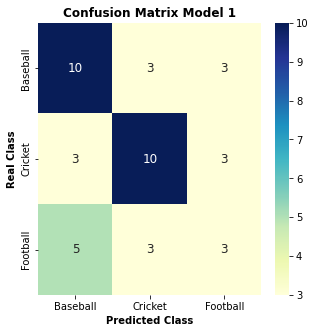

In [192]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix1,"Confusion Matrix Model 1",class_labels)

The model has a better performance classifiying baseball and cricket images but has a poorly performance in football images. 

## Model 2 Evaluation

In [193]:
#use the function (6) to get the classification report
classReport_model_2 = class_report(y_test,y_predict2,class_labels)
classReport_model_2 

,precision,recall,f1-score,support
Baseball,0.470588,0.500000,0.484848,16.000000
Cricket,0.666667,0.500000,0.571429,16.000000
Football,0.357143,0.454545,0.400000,11.000000
accuracy,0.488372,0.488372,0.488372,0.488372
macro avg,0.498133,0.484848,0.485426,43.000000
weighted avg,0.514527,0.488372,0.495359,43.000000


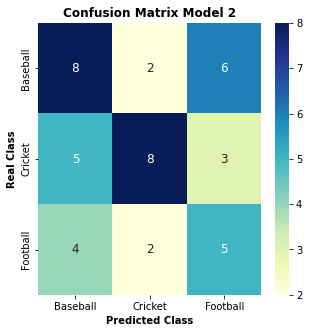

In [194]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix2,"Confusion Matrix Model 2",class_labels)

this model classifies cricket images best, but performs poorly in baseball and football.

## Model 3 Evaluation

In [293]:
#use the function (6) to get the classification report
classReport_model_3 = class_report(y_test,y_predict3,class_labels)
classReport_model_3 

,precision,recall,f1-score,support
Baseball,0.444444,0.750000,0.558140,16.000000
Cricket,1.000000,0.187500,0.315789,16.000000
Football,0.461538,0.545455,0.500000,11.000000
accuracy,0.488372,0.488372,0.488372,0.488372
macro avg,0.635328,0.494318,0.457976,43.000000
weighted avg,0.655536,0.488372,0.453090,43.000000


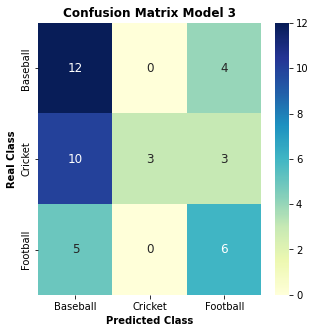

In [294]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix3,"Confusion Matrix Model 3",class_labels)

This model classifies baseball and football images best, it performs poorly for cricket.

## Model 4 Evaluation

In [197]:
#use the function (6) to get the classification report
classReport_model_4 = class_report(y_test,y_predict4,class_labels)
classReport_model_4

,precision,recall,f1-score,support
Baseball,0.440000,0.687500,0.536585,16.000000
Cricket,0.800000,0.250000,0.380952,16.000000
Football,0.461538,0.545455,0.500000,11.000000
accuracy,0.488372,0.488372,0.488372,0.488372
macro avg,0.567179,0.494318,0.472513,43.000000
weighted avg,0.579463,0.488372,0.469316,43.000000


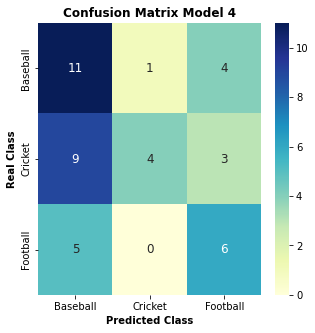

In [198]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix4,"Confusion Matrix Model 4",class_labels)

This model classifies baseball and football images best, it performs poorly for cricket.

## Model 5 Evaluation

In [199]:
#use the function (6) to get the classification report
classReport_model_5 = class_report(y_test,y_predict5,class_labels)
classReport_model_5

,precision,recall,f1-score,support
Baseball,0.500000,0.812500,0.619048,16.000000
Cricket,0.666667,0.500000,0.571429,16.000000
Football,0.400000,0.181818,0.250000,11.000000
accuracy,0.534884,0.534884,0.534884,0.534884
macro avg,0.522222,0.498106,0.480159,43.000000
weighted avg,0.536434,0.534884,0.506921,43.000000


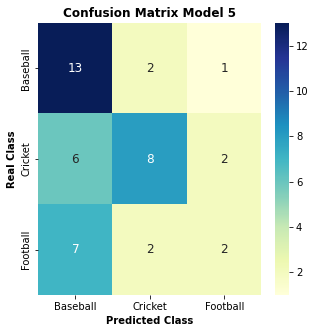

In [200]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix5,"Confusion Matrix Model 5",class_labels)

This model classifies baseball and cricket images best, it has very poor results for football.

## Evaluation Resume

In [304]:
#get the f1-macro avg score from the classification reports

classReport_models = [classReport_model_1,classReport_model_2,
                       classReport_model_3,classReport_model_4,
                       classReport_model_5]
 
f1_models = {}

for i,report in enumerate(classReport_models):
  f1_models["model"+str(i+1)] = round(report["f1-score"]["macro avg"] , 4)

 

In [305]:
#macro avg f1-score values sorted
models_created = pd.Series(f1_models,name="macro avg f1-score").sort_values(ascending=False)
models_created

model1    0.5044
model2    0.4854
model5    0.4802
model4    0.4725
model3    0.4580
Name: macro avg f1-score, dtype: float64

Model 1 is the one with the best f1 macro score, if it were chosen, it would classify cricket and baseball images better than football, it has very poor results in football and would probably confuse football images with cricket o baseball. 

The miss classification images are:
Image 3  True label Cricket and Predicted Baseball.
Image 27  True label Cricket and Predicted Football.
Image 29  True label Cricket and Predicted Baseball.
Image 27  True label Cricket and Predicted Football.
Image 3  True label Cricket and Predicted Baseball.
Image 26  True label Cricket and Predicted Baseball.


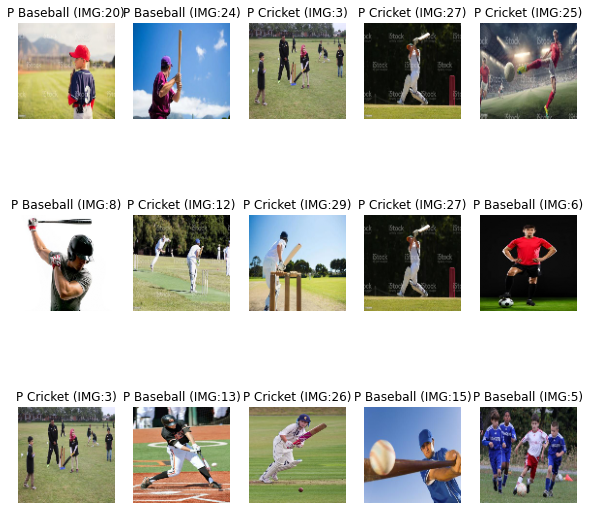

In [311]:
#plot the images with the predicted labels  
fig, ax = plt.subplots(nrows=3, ncols=5,figsize=(10,10))

print("The miss classification images are:") 
for row in ax:
  for col in row:
    img_idx = np.random.randint(0, X_test.shape[0])
    img = X_test[img_idx]
    col.imshow(img)
    col.set_title("P "+class_labels[y_predict1[img_idx]]+" (IMG:"+str(img_idx)+")")
    col.set_axis_off()
    
    true_label = class_labels[np.argmax(y_test[img_idx])]
    pred_label = class_labels[y_predict3[img_idx]]
    
    if true_label != pred_label:
      print('Image {}  True label {} and Predicted {}.'.format(img_idx,true_label, pred_label ))
    
plt.show()

The Model 1 has miss classify images that are very similar between sports, the training data is small a posible improvement for the model is train with a huge sport image dataset. There is another option use a trained model with a huge dataset and transfer it to our problem.  

# Transfer Learning

### Load Images 

In [204]:
#get the pre-trained model url (only the feature extractor).

url = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b0/feature_vector/2" 
efficientnetv2 = hub.KerasLayer(url, input_shape=(transfer_learning_size,transfer_learning_size,3))

### Build the Model

In [205]:
#freeze the training
efficientnetv2.trainable = False

In [206]:
#define the output layer
modelTL = tf.keras.Sequential([efficientnetv2,
                               keras.layers.Dense(3, activation='softmax')])

In [207]:
#model summary of the transfer learning model
modelTL.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1280)              5919312   
                                                                 
 dense_27 (Dense)            (None, 3)                 3843      
                                                                 
Total params: 5,923,155
Trainable params: 3,843
Non-trainable params: 5,919,312
_________________________________________________________________


In [208]:
#Compile
modelTL.compile(loss='categorical_crossentropy', optimizer=opt_Adam, metrics=['accuracy'])


### Train-Test Split 

In [209]:
#create the variables X and y, the former will contain the data images and the latter the labels  

X2 = []  
 
for img, labels in transfer_learning_images:
  X2.append(img)
     


In [210]:
#normalize the data image
X2 = np.array(X2).astype(float) / 255

In [211]:
#split the data
X_tl_train, X_tl_test, y_tl_train, y_tl_test = train_test_split( X2, y, test_size=0.2, random_state=7)

### Data Augmentation

In [212]:
#data augmentation 
data_image_generation.fit(X_tl_train)

In [213]:
#data image generation
data_gen_tl_train = data_image_generation.flow(X_tl_train, y_tl_train, batch_size=batch_size)

### Run Transfer Learning Model

In [214]:
#define the path to log created by tensonboard
logTL = TensorBoard(log_dir='logs/TL') 
 
callback_list = [earlyStopping,logTL]

history_TL = modelTL.fit(
    data_gen_tl_train,
    epochs=500, batch_size=batch_size,
    validation_data=(X_tl_test, y_tl_test),
    steps_per_epoch= X_tl_train.shape[0]//batch_size,
    validation_steps= y_tl_test.shape[0]//batch_size,
    shuffle= True,
    callbacks = callback_list

)

Epoch 1/500
21/21 [==============================] - 9s 136ms/step - loss: 1.0962 - accuracy: 0.4524 - val_loss: 1.1194 - val_accuracy: 0.4500
Epoch 2/500
21/21 [==============================] - 2s 92ms/step - loss: 1.0197 - accuracy: 0.5119 - val_loss: 1.1190 - val_accuracy: 0.4750
Epoch 3/500
21/21 [==============================] - 2s 89ms/step - loss: 0.9918 - accuracy: 0.5536 - val_loss: 1.0783 - val_accuracy: 0.4750
Epoch 4/500
21/21 [==============================] - 2s 88ms/step - loss: 0.9123 - accuracy: 0.6131 - val_loss: 1.0064 - val_accuracy: 0.5750
Epoch 5/500
21/21 [==============================] - 2s 93ms/step - loss: 0.8931 - accuracy: 0.6310 - val_loss: 0.9548 - val_accuracy: 0.6000
Epoch 6/500
21/21 [==============================] - 2s 88ms/step - loss: 0.8946 - accuracy: 0.5833 - val_loss: 0.9074 - val_accuracy: 0.6500
Epoch 7/500
21/21 [==============================] - 2s 92ms/step - loss: 0.8417 - accuracy: 0.6845 - val_loss: 0.8807 - val_accuracy: 0.6750
Epoch

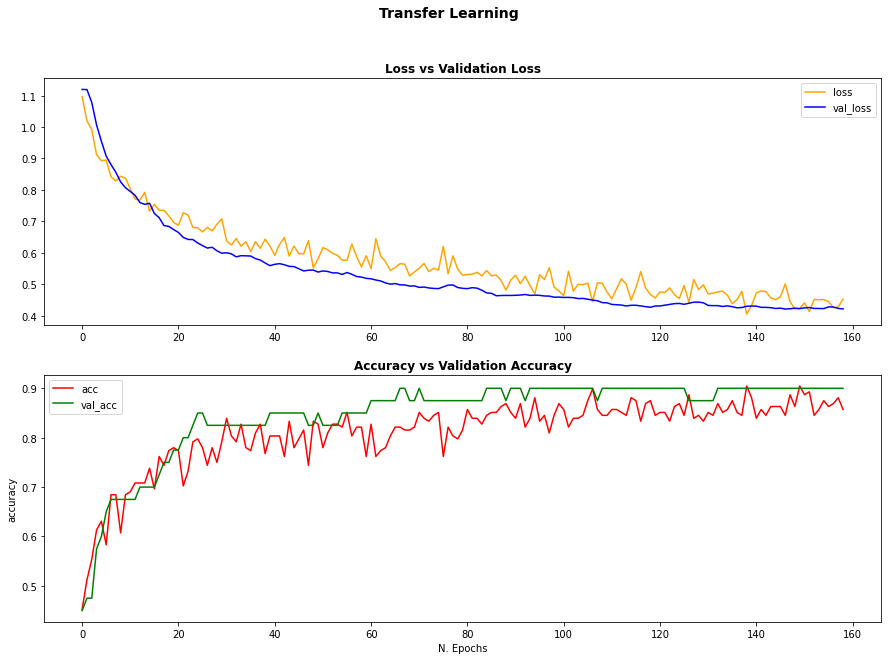

In [215]:
#use the function (3) to plot the accuracy and loss of the model 1  
plot_model_history(history_TL.history,"Transfer Learning")

This model tells us that its loss in both sets is going down while its accuracy is going up, it has a good prediction.

### Transfer Learning Evaluation 

In [216]:
#evaluate the TL model
scoresTL = modelTL.evaluate(X_tl_test,y_tl_test,verbose=1) 

2/2 [==============================] - 0s 36ms/step - loss: 0.4560 - accuracy: 0.8605


In [217]:
print("The CNN TL model has a loss of {} and accuracy {}.".format(round(scoresTL[0],4),round(scoresTL[1],4)))


The CNN TL model has a loss of 0.456 and accuracy 0.8605.


In [218]:
#use function (4) to predict the classes
y_predictTL = y_prediction(modelTL,X_tl_test)


2/2 - 1s - 720ms/epoch - 360ms/step


In [219]:
#use the function (5) to plot the confusion matrix models
confusion_matrixTL = confu_matrix(y_tl_test,y_predictTL)


In [220]:
#use the function (6) to get the classification report
classReport_model_TL = class_report(y_tl_test,y_predictTL,class_labels)
classReport_model_TL

,precision,recall,f1-score,support
Baseball,0.812500,0.812500,0.812500,16.000000
Cricket,1.000000,0.875000,0.933333,16.000000
Football,0.769231,0.909091,0.833333,11.000000
accuracy,0.860465,0.860465,0.860465,0.860465
macro avg,0.860577,0.865530,0.859722,43.000000
weighted avg,0.871199,0.860465,0.862791,43.000000


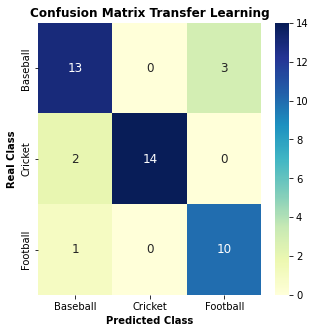

In [221]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrixTL,"Confusion Matrix Transfer Learning",class_labels)

This model would classify all three sports well and would have few errors. 

In [222]:
#get the f1-macro avg score
f1_tl = {"TL Model":round(classReport_model_TL["f1-score"]["macro avg"] , 4 )}  
f1_tl

{'TL Model': 0.8597}

In [223]:
#transform it to pandas series 
tl_df = pd.Series(f1_tl,name="macro avg f1-score")
tl_df

TL Model    0.8597
Name: macro avg f1-score, dtype: float64

# Model Evaluations Resume 

In [224]:
#concat all the model results 
f1_models = pd.concat([models_created,tl_df]).sort_values(ascending=False)
f1_models

TL Model    0.8597
model1      0.5044
model2      0.4854
model5      0.4802
model4      0.4725
model3      0.4580
Name: macro avg f1-score, dtype: float64

The Transfer Learning model has better results is a pre-trained model with a huge dataset and with a better structured network. The result didn't convince me so I will try "balancing" the number of images.

#Balanced Dataset

From the previous results I will balance the dataset that is classified as mild but maybe affect the model.  

* In this section I will perform CNN training with a balanced set of images by selecting an equal number of images as a balancing measure.

## Load images

In [225]:
#get the number of item
len(df_baseball),len(df_cricket),len(df_football),  

(66, 81, 64)

In [226]:
balanced_baseball_df = df_baseball.iloc[:64,:] 
balanced_cricket_df = df_cricket.iloc[:64,:] 

In [227]:
#concat the three DF's
df_train_balanced = pd.concat([balanced_baseball_df,balanced_cricket_df,df_football],ignore_index=True)
df_train_balanced.head()

,dirSport,Label
0,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
1,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
2,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
3,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
4,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball


In [228]:
 #shuffle the DF files
df_train_balanced = df_train_balanced.sample(frac = 1, random_state=1).reset_index(drop = True) 
df_train_balanced.head() 

,dirSport,Label
0,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
1,/content/drive/My Drive/Barcelona Activa/Itine...,Cricket
2,/content/drive/My Drive/Barcelona Activa/Itine...,Football
3,/content/drive/My Drive/Barcelona Activa/Itine...,Baseball
4,/content/drive/My Drive/Barcelona Activa/Itine...,Football


## Preprocessing

In [229]:
#resize the images for the CNN and transfer learning 

 
training_images_v2 = []
transfer_learning_images_v2 = []

for i,path in enumerate(df_train_balanced["dirSport"]):  
    img = mpimg.imread(path)   
    img = cv2.resize(img, (img_size, img_size))
    tl_img = cv2.resize(img, (transfer_learning_size, transfer_learning_size))
    label = df_train_balanced["Label"].iloc[i]
    training_images_v2.append([img, label])
    transfer_learning_images_v2.append([tl_img, label])

In [230]:
 #create the variables X and y, the former will contain the data images 
#and the latter the labels  

X2 = []  
y2 = []  

for img, labels in training_images_v2:
    X2.append(img)
    y2.append(labels)

In [231]:
#normalize the data image to get values from 0-1
X2 = np.array(X2).astype(float) / 255
 

In [232]:
#encode the labels to int
 
y2 = np.array(y2).reshape(-1, 1)
y2 = le.fit_transform(y2)
y2

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0, 1, 2, 0, 2, 0, 1, 1, 1, 2, 2, 1, 0, 0, 1, 1, 0, 0, 0, 2, 0, 0,
       1, 2, 0, 1, 2, 1, 0, 2, 1, 1, 0, 1, 2, 0, 0, 0, 2, 2, 1, 2, 2, 2,
       0, 2, 2, 0, 2, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 2, 0, 2, 1, 0, 2, 1,
       1, 2, 1, 0, 1, 1, 2, 2, 1, 1, 0, 1, 2, 0, 1, 0, 2, 2, 2, 1, 1, 2,
       1, 2, 1, 0, 1, 2, 0, 1, 1, 2, 0, 1, 0, 2, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 2, 2, 1, 2, 2, 2, 0, 0, 0, 2, 0, 1, 2, 2, 0, 1, 1, 0, 1, 0,
       2, 1, 2, 1, 2, 1, 0, 0, 2, 1, 1, 0, 0, 1, 0, 0, 0, 2, 0, 2, 2, 2,
       0, 1, 1, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 1, 1, 1, 0, 2, 2, 2,
       2, 2, 1, 0, 2, 0, 2, 1, 2, 2, 1, 2, 2, 1, 2, 0])

In [233]:
#convert the integers  to binary class matrix.
y2 = to_categorical(y2,3)

## Train-Test Split

In [234]:
#split the data to train and test
X_train_v2, X_test_v2, y_train_v2, y_test_v2 = train_test_split( X2, y2, test_size=0.2, random_state=7)

In [235]:
#train and test dataframe shape
X_train_v2.shape, X_test_v2.shape, y_train_v2.shape, y_test_v2.shape

((153, 100, 100, 3), (39, 100, 100, 3), (153, 3), (39, 3))

## Build Model

### Data Augmentation

In [236]:
#feed the model with a batch size of 17 to run over all the 153 files 
batch_size_v2 = 17

data_gen_train_v2 = data_image_generation.flow(X_train_v2, y_train_v2, batch_size=batch_size_v2)

### Run Balanced Model 1

In [237]:
 #define the path to log created by tensonboard
logCNN1_v2 = TensorBoard(log_dir='logs/cnn1v2') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN1_v2]

history_1_v2 = modelCNN.fit(
    data_gen_train_v2,
    epochs=500, batch_size= batch_size_v2,
    validation_data=(X_test_v2, y_test_v2),
    steps_per_epoch= X_train_v2.shape[0]//batch_size_v2,
    validation_steps= y_test_v2.shape[0]//batch_size_v2,
    shuffle= False,
    callbacks = callback_list

)

Epoch 1/500
9/9 [==============================] - 1s 56ms/step - loss: 0.7920 - accuracy: 0.7582 - val_loss: 0.4891 - val_accuracy: 0.8824
Epoch 2/500
9/9 [==============================] - 1s 56ms/step - loss: 0.6104 - accuracy: 0.7516 - val_loss: 0.5918 - val_accuracy: 0.7941
Epoch 3/500
9/9 [==============================] - 0s 51ms/step - loss: 0.5962 - accuracy: 0.7582 - val_loss: 0.5582 - val_accuracy: 0.8529
Epoch 4/500
9/9 [==============================] - 0s 48ms/step - loss: 0.5803 - accuracy: 0.8039 - val_loss: 0.5384 - val_accuracy: 0.8529
Epoch 5/500
9/9 [==============================] - 0s 50ms/step - loss: 0.6054 - accuracy: 0.7582 - val_loss: 0.5530 - val_accuracy: 0.8529
Epoch 6/500
9/9 [==============================] - 0s 50ms/step - loss: 0.6443 - accuracy: 0.7386 - val_loss: 0.5673 - val_accuracy: 0.8824
Epoch 7/500
9/9 [==============================] - 0s 49ms/step - loss: 0.5767 - accuracy: 0.7843 - val_loss: 0.5457 - val_accuracy: 0.8529
Epoch 8/500
9/9 [===

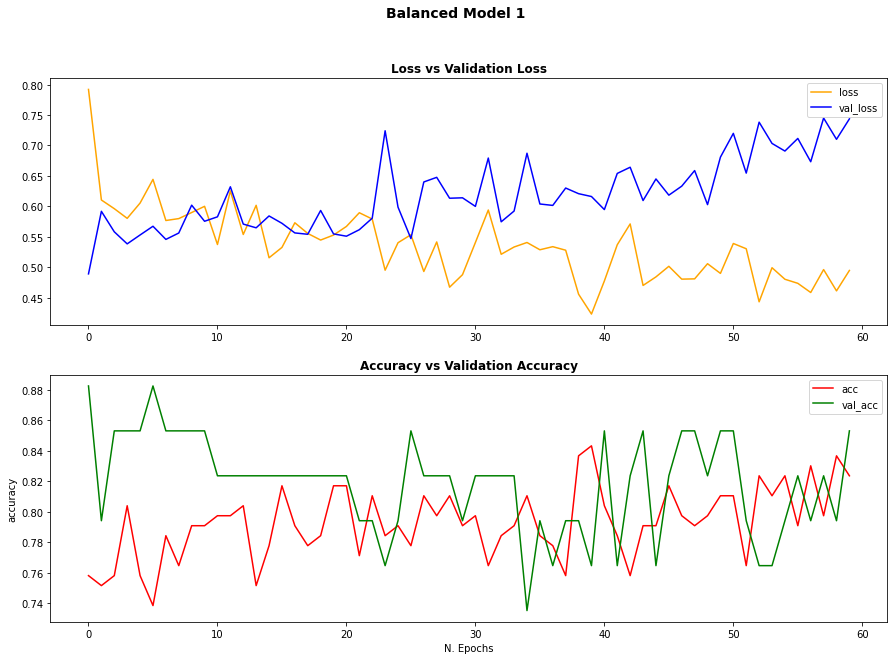

In [238]:
#use the function (3) to plot the accuracy and loss of the model   
plot_model_history(history_1_v2.history,"Balanced Model 1")

the model behaves better, both loss and accuracy try not to separate.

### Run Balanced Model 2

In [239]:
 #define the path to log created by tensonboard
logCNN2_v2 = TensorBoard(log_dir='logs/cnn2v2') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN2_v2]

history_2_v2 = modelCNN2.fit(
    data_gen_train_v2,
    epochs=500, batch_size= batch_size_v2,
    validation_data=(X_test_v2, y_test_v2),
    steps_per_epoch= X_train_v2.shape[0]//batch_size_v2,
    validation_steps= y_test_v2.shape[0]//batch_size_v2,
    shuffle= False,
    callbacks = callback_list

)

Epoch 1/500
9/9 [==============================] - 1s 72ms/step - loss: 0.6501 - accuracy: 0.8301 - val_loss: 0.5945 - val_accuracy: 0.8529
Epoch 2/500
9/9 [==============================] - 1s 64ms/step - loss: 0.4798 - accuracy: 0.8497 - val_loss: 0.6027 - val_accuracy: 0.8824
Epoch 3/500
9/9 [==============================] - 1s 64ms/step - loss: 0.4573 - accuracy: 0.8366 - val_loss: 0.5137 - val_accuracy: 0.8235
Epoch 4/500
9/9 [==============================] - 1s 63ms/step - loss: 0.3806 - accuracy: 0.9020 - val_loss: 0.5062 - val_accuracy: 0.8235
Epoch 5/500
9/9 [==============================] - 1s 65ms/step - loss: 0.3438 - accuracy: 0.8627 - val_loss: 0.5455 - val_accuracy: 0.8529
Epoch 6/500
9/9 [==============================] - 1s 65ms/step - loss: 0.3925 - accuracy: 0.8497 - val_loss: 0.4503 - val_accuracy: 0.8529
Epoch 7/500
9/9 [==============================] - 1s 64ms/step - loss: 0.2940 - accuracy: 0.8889 - val_loss: 0.3874 - val_accuracy: 0.8529
Epoch 8/500
9/9 [===

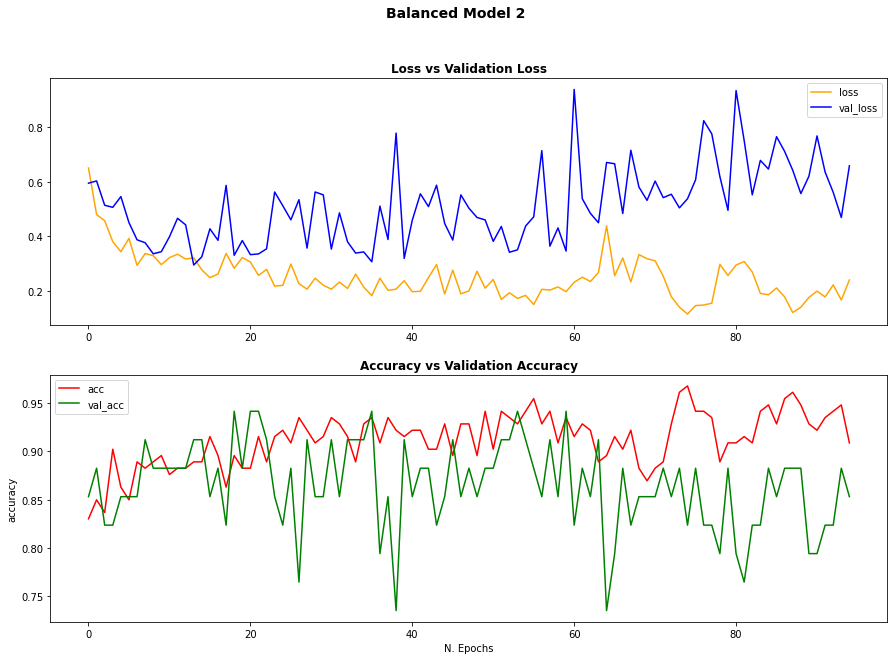

In [240]:
#use the function (3) to plot the accuracy and loss of the model   
plot_model_history(history_2_v2.history,"Balanced Model 2")

the model performs better than its unbalanced counterpart, both loss and accuracy try not to separate.

### Run Balanced Model 3

In [295]:
 #define the path to log created by tensonboard
logCNN3_v2 = TensorBoard(log_dir='logs/cnn3v2') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN3_v2]

history_3_v2 = modelCNN3.fit(
    data_gen_train_v2,
    epochs=500, batch_size= batch_size_v2,
    validation_data=(X_test_v2, y_test_v2),
    steps_per_epoch= X_train_v2.shape[0]//batch_size_v2,
    validation_steps= y_test_v2.shape[0]//batch_size_v2,
    shuffle= False,
    callbacks = callback_list

)

Epoch 1/500
9/9 [==============================] - 0s 52ms/step - loss: 0.9173 - accuracy: 0.6078 - val_loss: 0.5872 - val_accuracy: 0.7941
Epoch 2/500
9/9 [==============================] - 0s 47ms/step - loss: 0.8258 - accuracy: 0.6405 - val_loss: 0.6714 - val_accuracy: 0.7647
Epoch 3/500
9/9 [==============================] - 0s 47ms/step - loss: 0.8380 - accuracy: 0.6601 - val_loss: 0.6047 - val_accuracy: 0.7647
Epoch 4/500
9/9 [==============================] - 0s 48ms/step - loss: 0.8471 - accuracy: 0.6667 - val_loss: 0.6008 - val_accuracy: 0.7941
Epoch 5/500
9/9 [==============================] - 0s 50ms/step - loss: 0.7838 - accuracy: 0.6667 - val_loss: 0.6574 - val_accuracy: 0.7647
Epoch 6/500
9/9 [==============================] - 0s 48ms/step - loss: 0.7755 - accuracy: 0.6405 - val_loss: 0.5963 - val_accuracy: 0.7647
Epoch 7/500
9/9 [==============================] - 0s 50ms/step - loss: 0.7778 - accuracy: 0.6601 - val_loss: 0.5950 - val_accuracy: 0.8235
Epoch 8/500
9/9 [===

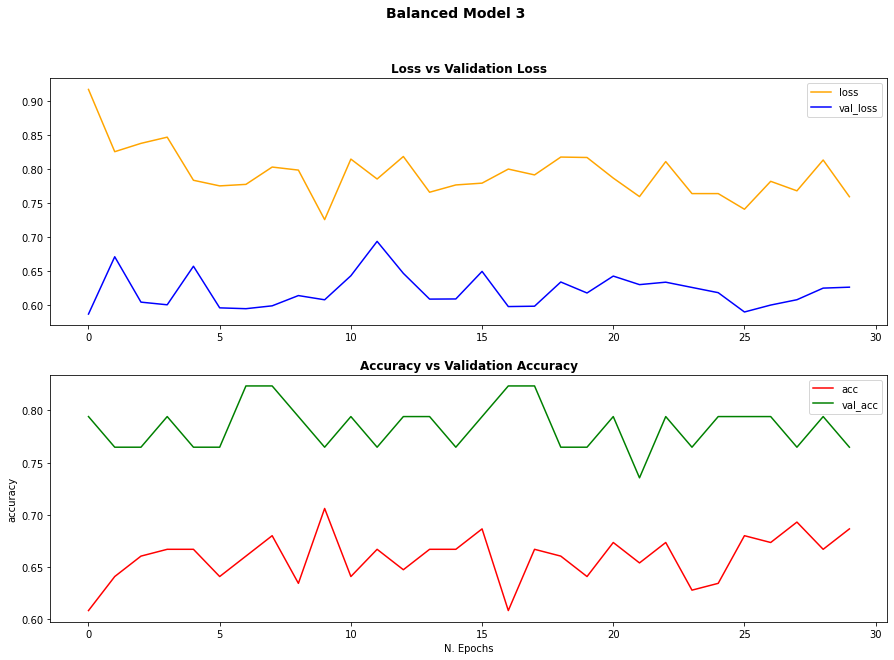

In [296]:
#use the function (3) to plot the accuracy and loss of the model   
plot_model_history(history_3_v2.history,"Balanced Model 3")

This model did not have an improvement.

### Run Balanced Model 4


In [243]:
 #define the path to log created by tensonboard
logCNN4_v2 = TensorBoard(log_dir='logs/cnn4v2') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN4_v2]

history_4_v2 = modelCNN4.fit(
    data_gen_train_v2,
    epochs=500, batch_size=batch_size_v2,
    validation_data=(X_test_v2, y_test_v2),
    steps_per_epoch= X_train_v2.shape[0]//batch_size_v2,
    validation_steps= y_test_v2.shape[0]//batch_size_v2,
    shuffle= False,
    callbacks = callback_list

)

Epoch 1/500
9/9 [==============================] - 0s 52ms/step - loss: 0.9141 - accuracy: 0.6732 - val_loss: 0.7207 - val_accuracy: 0.7059
Epoch 2/500
9/9 [==============================] - 0s 47ms/step - loss: 0.8158 - accuracy: 0.6209 - val_loss: 0.7385 - val_accuracy: 0.7059
Epoch 3/500
9/9 [==============================] - 0s 48ms/step - loss: 0.8096 - accuracy: 0.6536 - val_loss: 0.7242 - val_accuracy: 0.7353
Epoch 4/500
9/9 [==============================] - 0s 46ms/step - loss: 0.7321 - accuracy: 0.6863 - val_loss: 0.7397 - val_accuracy: 0.6765
Epoch 5/500
9/9 [==============================] - 0s 48ms/step - loss: 0.8121 - accuracy: 0.6536 - val_loss: 0.7282 - val_accuracy: 0.7353
Epoch 6/500
9/9 [==============================] - 0s 48ms/step - loss: 0.7743 - accuracy: 0.6536 - val_loss: 0.7196 - val_accuracy: 0.7353
Epoch 7/500
9/9 [==============================] - 0s 47ms/step - loss: 0.8342 - accuracy: 0.6536 - val_loss: 0.7366 - val_accuracy: 0.7059
Epoch 8/500
9/9 [===

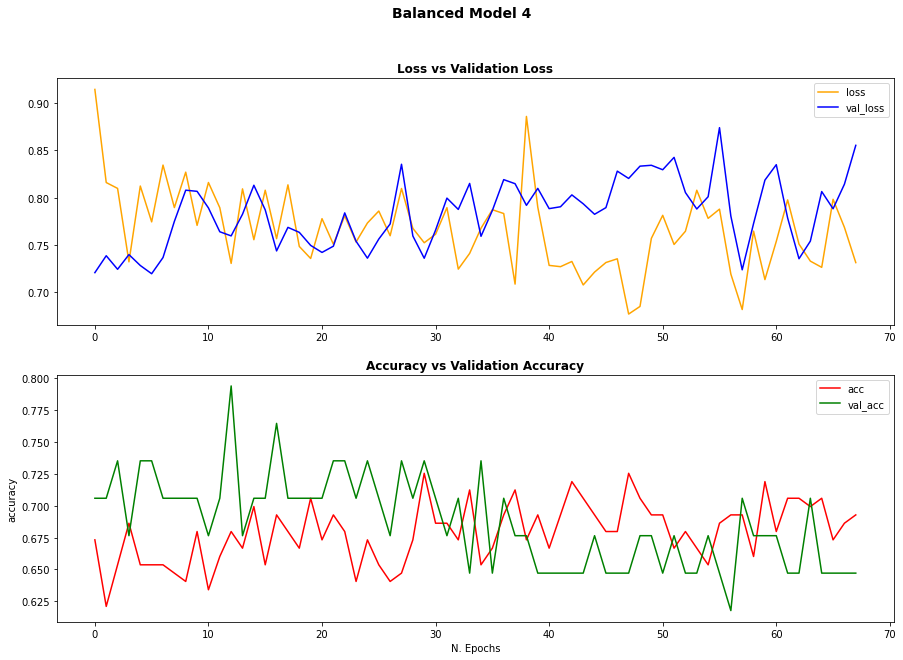

In [244]:
#use the function (3) to plot the accuracy and loss of the model   
plot_model_history(history_4_v2.history,"Balanced Model 4")

the model performs better than its unbalanced counterpart, both loss and accuracy try not to separate.

### Run Balanced Model 5


In [245]:
 #define the path to log created by tensonboard
logCNN5_v2 = TensorBoard(log_dir='logs/cnn5v2') 

# the callbacks will be the earlyStopping and tensorboard
callback_list = [earlyStopping,logCNN5_v2]

history_5_v2 = modelCNN5.fit(
    data_gen_train_v2,
    epochs=500, batch_size=batch_size_v2,
    validation_data=(X_test_v2, y_test_v2),
    steps_per_epoch= X_train_v2.shape[0]//batch_size_v2,
    validation_steps= y_test_v2.shape[0]//batch_size_v2,
    shuffle= False,
    callbacks = callback_list

)

Epoch 1/500
9/9 [==============================] - 1s 62ms/step - loss: 0.8429 - accuracy: 0.6471 - val_loss: 0.7433 - val_accuracy: 0.6765
Epoch 2/500
9/9 [==============================] - 1s 54ms/step - loss: 0.8331 - accuracy: 0.6405 - val_loss: 0.7291 - val_accuracy: 0.7059
Epoch 3/500
9/9 [==============================] - 0s 49ms/step - loss: 0.8323 - accuracy: 0.6601 - val_loss: 0.7336 - val_accuracy: 0.6471
Epoch 4/500
9/9 [==============================] - 0s 49ms/step - loss: 0.8483 - accuracy: 0.6340 - val_loss: 0.7311 - val_accuracy: 0.7353
Epoch 5/500
9/9 [==============================] - 0s 49ms/step - loss: 0.8124 - accuracy: 0.6797 - val_loss: 0.7181 - val_accuracy: 0.7647
Epoch 6/500
9/9 [==============================] - 0s 52ms/step - loss: 0.9049 - accuracy: 0.6405 - val_loss: 0.7022 - val_accuracy: 0.7059
Epoch 7/500
9/9 [==============================] - 0s 49ms/step - loss: 0.8584 - accuracy: 0.6667 - val_loss: 0.6977 - val_accuracy: 0.7353
Epoch 8/500
9/9 [===

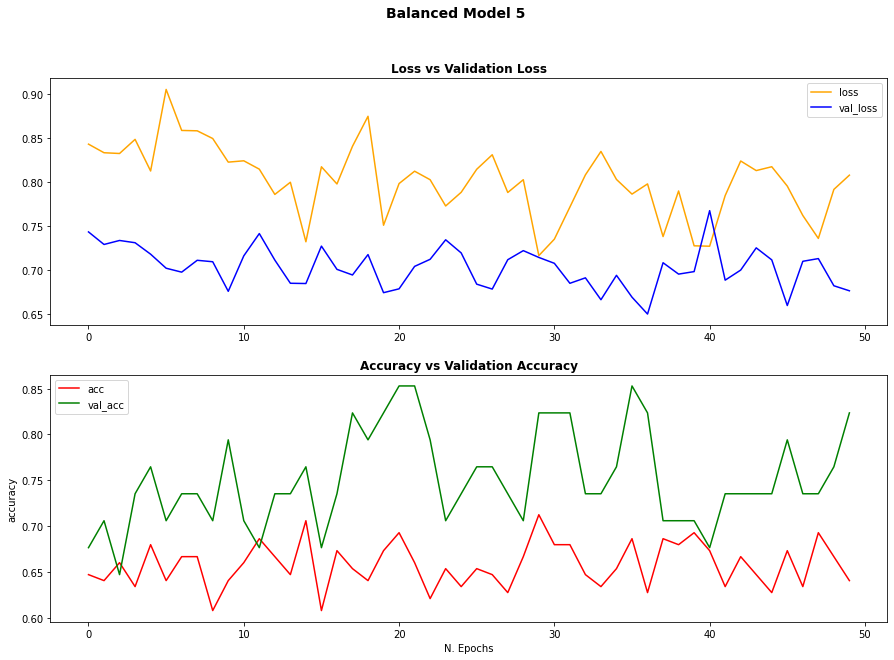

In [246]:
#use the function (3) to plot the accuracy and loss of the model   
plot_model_history(history_5_v2.history,"Balanced Model 5")

the model performs better than its unbalanced counterpart, both loss and accuracy try not to separate.

## Model Evaluation

### Scores

In [247]:
scores1 = modelCNN.evaluate(X_test_v2,y_test_v2,verbose=1)
scores2 = modelCNN2.evaluate(X_test_v2,y_test_v2,verbose=1)
scores3 = modelCNN3.evaluate(X_test_v2,y_test_v2,verbose=1)
scores4 = modelCNN4.evaluate(X_test_v2,y_test_v2,verbose=1)
scores4 = modelCNN5.evaluate(X_test_v2,y_test_v2,verbose=1)

scores_models = [scores1,scores2,scores3,scores4,scores5]


2/2 [==============================] - 0s 10ms/step - loss: 0.7119 - accuracy: 0.7949


In [248]:
#use function (4) to predict the classes
y_predict1_v2 = y_prediction(modelCNN,X_test_v2)
y_predict2_v2 = y_prediction(modelCNN2,X_test_v2)
y_predict3_v2 = y_prediction(modelCNN3,X_test_v2)
y_predict4_v2 = y_prediction(modelCNN4,X_test_v2)
y_predict5_v2 = y_prediction(modelCNN5,X_test_v2)

2/2 - 0s - 31ms/epoch - 15ms/step
2/2 - 0s - 52ms/epoch - 26ms/step
2/2 - 0s - 26ms/epoch - 13ms/step
2/2 - 0s - 25ms/epoch - 13ms/step
2/2 - 0s - 25ms/epoch - 13ms/step


In [249]:
#use the function (5) to get the confusion matrix values of the models
confusion_matrix1_v2 = confu_matrix(y_test_v2,y_predict1_v2)
confusion_matrix2_v2 = confu_matrix(y_test_v2,y_predict2_v2)
confusion_matrix3_v2 = confu_matrix(y_test_v2,y_predict3_v2)
confusion_matrix4_v2 = confu_matrix(y_test_v2,y_predict4_v2)
confusion_matrix5_v2 = confu_matrix(y_test_v2,y_predict5_v2)

### Balanced Model 1 Evaluation

In [250]:
#use the function (6) to get the classification report
classReport_model_1_v2 = class_report(y_test_v2,y_predict1_v2,class_labels)
classReport_model_1_v2

,precision,recall,f1-score,support
Baseball,0.823529,0.875000,0.848485,16.000000
Cricket,0.833333,0.833333,0.833333,12.000000
Football,0.900000,0.818182,0.857143,11.000000
accuracy,0.846154,0.846154,0.846154,0.846154
macro avg,0.852288,0.842172,0.846320,39.000000
weighted avg,0.848115,0.846154,0.846265,39.000000


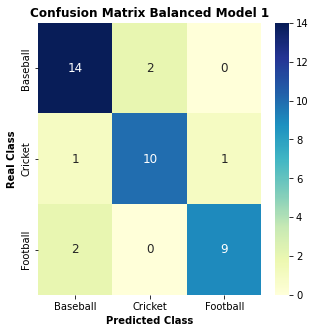

In [251]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix1_v2,"Confusion Matrix Balanced Model 1",class_labels)

This model would perform well in ranking all three sports.

### Balanced Model 2 Evaluation

In [252]:
#use the function (6) to get the classification report
classReport_model_2_v2 = class_report(y_test_v2,y_predict2_v2,class_labels)
classReport_model_2_v2

,precision,recall,f1-score,support
Baseball,0.833333,0.937500,0.882353,16.000000
Cricket,0.900000,0.750000,0.818182,12.000000
Football,0.818182,0.818182,0.818182,11.000000
accuracy,0.846154,0.846154,0.846154,0.846154
macro avg,0.850505,0.835227,0.839572,39.000000
weighted avg,0.849573,0.846154,0.844508,39.000000


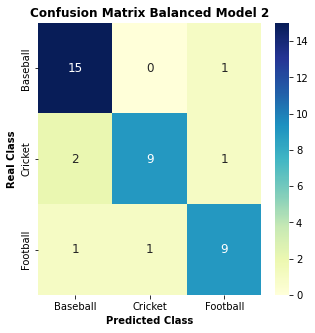

In [253]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix2_v2,"Confusion Matrix Balanced Model 2",class_labels)

This model would perform well in ranking all three sports but would stand out in baseball

### Balanced Model 3 Evaluation

In [297]:
#use the function (6) to get the classification report
classReport_model_3_v2 = class_report(y_test_v2,y_predict3_v2,class_labels)
classReport_model_3_v2

,precision,recall,f1-score,support
Baseball,0.454545,0.625000,0.526316,16.000000
Cricket,0.600000,0.250000,0.352941,12.000000
Football,0.250000,0.272727,0.260870,11.000000
accuracy,0.410256,0.410256,0.410256,0.410256
macro avg,0.434848,0.382576,0.380042,39.000000
weighted avg,0.441608,0.410256,0.398100,39.000000


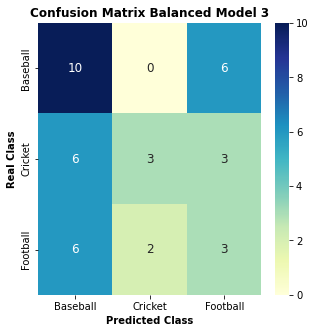

In [298]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix3_v2,"Confusion Matrix Balanced Model 3",class_labels)

This model does not perform well; better results would be obtained randomly.

### Balanced Model 4 Evaluation

In [256]:
#use the function (6) to get the classification report
classReport_model_4_v2 = class_report(y_test_v2,y_predict4_v2,class_labels)
classReport_model_4_v2

,precision,recall,f1-score,support
Baseball,0.647059,0.687500,0.666667,16.000000
Cricket,0.750000,0.500000,0.600000,12.000000
Football,0.571429,0.727273,0.640000,11.000000
accuracy,0.641026,0.641026,0.641026,0.641026
macro avg,0.656162,0.638258,0.635556,39.000000
weighted avg,0.657401,0.641026,0.638632,39.000000


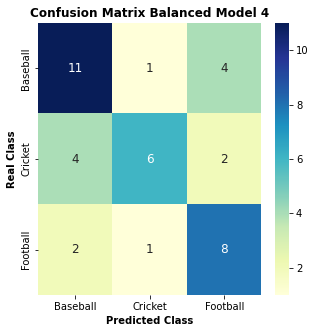

In [257]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix4_v2,"Confusion Matrix Balanced Model 4",class_labels)

This model has average results for all three sports.

### Balanced Model 5 Evaluation

In [258]:
#use the function (6) to get the classification report
classReport_model_5_v2 = class_report(y_test_v2,y_predict5_v2,class_labels)
classReport_model_5_v2

,precision,recall,f1-score,support
Baseball,0.777778,0.875000,0.823529,16.000000
Cricket,0.750000,0.750000,0.750000,12.000000
Football,0.888889,0.727273,0.800000,11.000000
accuracy,0.794872,0.794872,0.794872,0.794872
macro avg,0.805556,0.784091,0.791176,39.000000
weighted avg,0.800570,0.794872,0.794268,39.000000


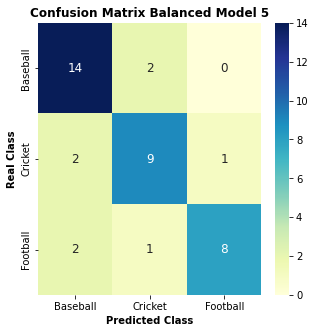

In [259]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrix5_v2,"Confusion Matrix Balanced Model 5",class_labels)

This model would classify baseball and football images better but would still perform well for cricket.

### Evaluation Resume

In [306]:
#get the f1-macro avg score from the classification reports
 
f1_models_v2 = {}

f1_models_v2["model 1"] = round(classReport_model_1_v2["f1-score"]["macro avg"] , 4)
f1_models_v2["model 2"] = round(classReport_model_2_v2["f1-score"]["macro avg"] , 4)
f1_models_v2["model 3"] = round(classReport_model_3_v2["f1-score"]["macro avg"] , 4)
f1_models_v2["model 4"] = round(classReport_model_4_v2["f1-score"]["macro avg"] , 4)
f1_models_v2["model 5"] = round(classReport_model_5_v2["f1-score"]["macro avg"] , 4)
   
 

In [307]:
#macro avg f1-score values sorted
models_created_v2 = pd.Series(f1_models_v2,name="macro avg f1-score").sort_values(ascending=False)
models_created_v2

model 1    0.8463
model 2    0.8396
model 5    0.7912
model 4    0.6356
model 3    0.3800
Name: macro avg f1-score, dtype: float64

The model 1 with a balance Dataset has almost 68% aof improvement, balance the dataset was key to improve the perfomance of the models in this case.  

## Build Transfer Learning

### Train-Test Split  

In [262]:
#create the variables X and y, the former will contain the data images and the latter the labels  

X2_tl_v2 = []
  
for img, labels in transfer_learning_images_v2:
  X2_tl_v2.append(img)
   

In [263]:
#normalize the data image
X2_tl_v2 = np.array(X2_tl_v2).astype(float) / 255

In [264]:
X2_tl_v2.shape,y2.shape

((192, 224, 224, 3), (192, 3))

In [265]:
#split the data
X_tl_train_v2, X_tl_test_v2, y_tl_train_v2, y_tl_test_v2 = train_test_split( X2_tl_v2, y2, test_size=0.2, random_state=7)

### Data Augmentation

In [266]:
#data augmentation 
data_image_generation.fit(X_tl_train_v2)

In [267]:
#data image generation
data_gen_tl_train_v2 = data_image_generation.flow(X_tl_train_v2, y_tl_train_v2, batch_size=batch_size_v2)

### Run Balanced Transfer Learning Model

In [268]:
#define the path to log created by tensonboard
logTL_v2 = TensorBoard(log_dir='logs/TLv2') 
 
callback_list = [earlyStopping,logTL_v2]

history_TL_v2 = modelTL.fit(
    data_gen_tl_train_v2,
    epochs=500, batch_size=batch_size_v2,
    validation_data=(X_tl_test_v2, y_tl_test_v2),
    steps_per_epoch= X_tl_train_v2.shape[0]//batch_size_v2,
    validation_steps= y_tl_test_v2.shape[0]//batch_size_v2,
    shuffle= False,
    callbacks = callback_list

)

Epoch 1/500
9/9 [==============================] - 4s 322ms/step - loss: 0.4815 - accuracy: 0.8562 - val_loss: 0.3179 - val_accuracy: 0.9412
Epoch 2/500
9/9 [==============================] - 2s 190ms/step - loss: 0.4785 - accuracy: 0.8562 - val_loss: 0.3192 - val_accuracy: 0.9412
Epoch 3/500
9/9 [==============================] - 2s 199ms/step - loss: 0.5452 - accuracy: 0.8039 - val_loss: 0.3193 - val_accuracy: 0.9412
Epoch 4/500
9/9 [==============================] - 3s 333ms/step - loss: 0.4567 - accuracy: 0.8627 - val_loss: 0.3196 - val_accuracy: 0.9412
Epoch 5/500
9/9 [==============================] - 2s 193ms/step - loss: 0.4756 - accuracy: 0.8562 - val_loss: 0.3203 - val_accuracy: 0.9412
Epoch 6/500
9/9 [==============================] - 2s 182ms/step - loss: 0.4947 - accuracy: 0.8301 - val_loss: 0.3212 - val_accuracy: 0.9412
Epoch 7/500
9/9 [==============================] - 2s 193ms/step - loss: 0.5136 - accuracy: 0.8301 - val_loss: 0.3220 - val_accuracy: 0.9412
Epoch 8/500
9

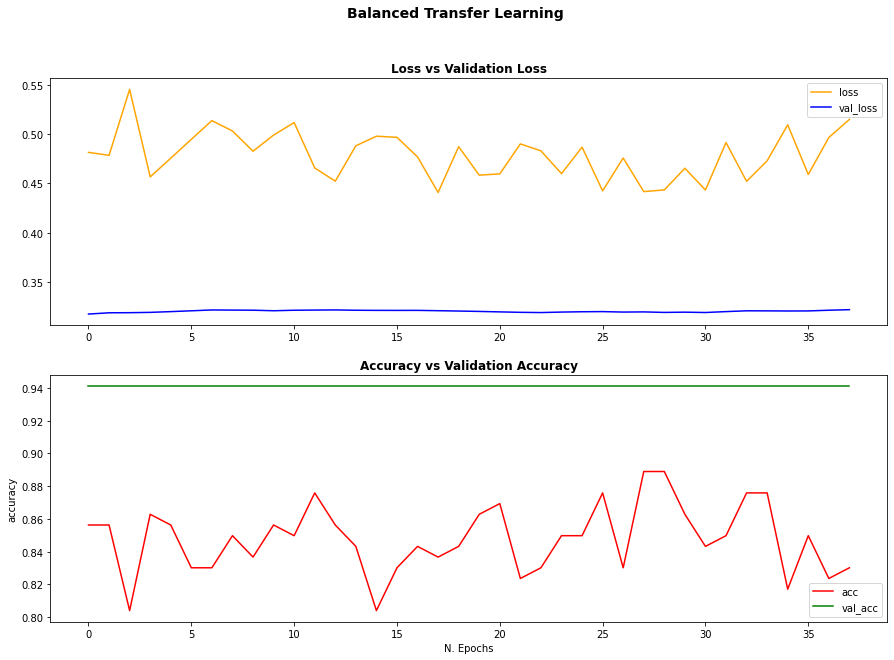

In [269]:
#use the function (3) to plot the accuracy and loss of the model 1  
plot_model_history(history_TL_v2.history,"Balanced Transfer Learning")

From this graph I understand that for the validation set its loss/accuracy has a very slight increase/decrease value, which may appear to be constant. In the training set, it seems to me to try to follow a "straight line" compensating for these abrupt drops with rises and vice versa.

### Transfer Learning Evaluation

In [270]:
#evaluate the TL model
scoresTL_v2 = modelTL.evaluate(X_tl_test_v2,y_tl_test_v2,verbose=1) 

2/2 [==============================] - 0s 29ms/step - loss: 0.3200 - accuracy: 0.9487


In [271]:
#use function (4) to predict the classes
y_predictTL_v2 = y_prediction(modelTL,X_tl_test_v2)


2/2 - 0s - 102ms/epoch - 51ms/step


In [272]:
#use the function (5) to plot the confusion matrix models
confusion_matrixTL_v2 = confu_matrix(y_tl_test_v2,y_predictTL_v2)


In [273]:
#use the function (6) to get the classification report
classReport_model_TL_v2 = class_report(y_tl_test_v2,y_predictTL_v2,class_labels)
classReport_model_TL_v2

,precision,recall,f1-score,support
Baseball,0.937500,0.937500,0.937500,16.000000
Cricket,1.000000,0.916667,0.956522,12.000000
Football,0.916667,1.000000,0.956522,11.000000
accuracy,0.948718,0.948718,0.948718,0.948718
macro avg,0.951389,0.951389,0.950181,39.000000
weighted avg,0.950855,0.948718,0.948718,39.000000


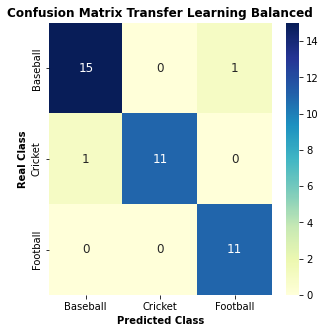

In [274]:
#use the function (7) to plot the confusion matrix
plot_conf_matrix(confusion_matrixTL_v2,"Confusion Matrix Transfer Learning Balanced",class_labels)

This model would rank all three sports very well, but cricket and football would stand out.

In [275]:
#get the f1-macro avg score
f1_tl_v2 = {"TL Model":round(classReport_model_TL_v2["f1-score"]["macro avg"] , 4 )}  
f1_tl_v2

{'TL Model': 0.9502}

In [276]:
#transform it to pandas series 
tl_df_v2 = pd.Series(f1_tl_v2,name="macro avg f1-score")
tl_df_v2

TL Model    0.9502
Name: macro avg f1-score, dtype: float64

This model has a 10.5% improvement so one with image balancing. 

## Balanced Evaluation Resume

In [302]:
#concat all the model results 
f1_models_balanced = pd.concat([models_created_v2,tl_df_v2]).sort_values(ascending=False)
f1_models_balanced

TL Model    0.9502
model 1     0.8463
model 2     0.8396
model 5     0.7912
model 4     0.6356
model 3     0.3800
Name: macro avg f1-score, dtype: float64

Despite increases in model improvement the Transfer Learning Model has a better performance. 

# Comparison Model Evaluations

In [278]:
#Run tensorboard and tell it to read the "logs" folder.
%tensorboard --logdir logs


Output hidden; open in https://colab.research.google.com to view.

In [303]:
print(f1_models) 
print(f1_models_balanced)

{'model1': 0.5044, 'model2': 0.4854, 'model3': 0.458, 'model4': 0.4725, 'model5': 0.4802}
TL Model    0.9502
model 1     0.8463
model 2     0.8396
model 5     0.7912
model 4     0.6356
model 3     0.3800
Name: macro avg f1-score, dtype: float64


The Transfer Learning model with a balanced set of images has a better performance and will be selected to classified the test set. 

In [308]:
# I will save the first three models
modelCNN3.save('balanced_model_CNN1.h5')
modelCNN4.save('balanced_model_CNN2.h5')
modelTL.save('balanced_model_TL.h5')

# Classify the test images 

In [281]:
list_test_images = []

for f in test_images:
  path = dir_test+'/'+ f
  img = mpimg.imread(path)
  img = cv2.resize(img, (transfer_learning_size,transfer_learning_size))
  list_test_images.append(img) 
   

In [282]:
#normalize the data image
y_images = np.array(list_test_images).astype(float) / 255
 

In [283]:
test_pred = modelTL.predict(y_images) 
test_pred[0] 

array([0.19437964, 0.25707972, 0.54854065], dtype=float32)

In [284]:
test_pred.shape[0]

41

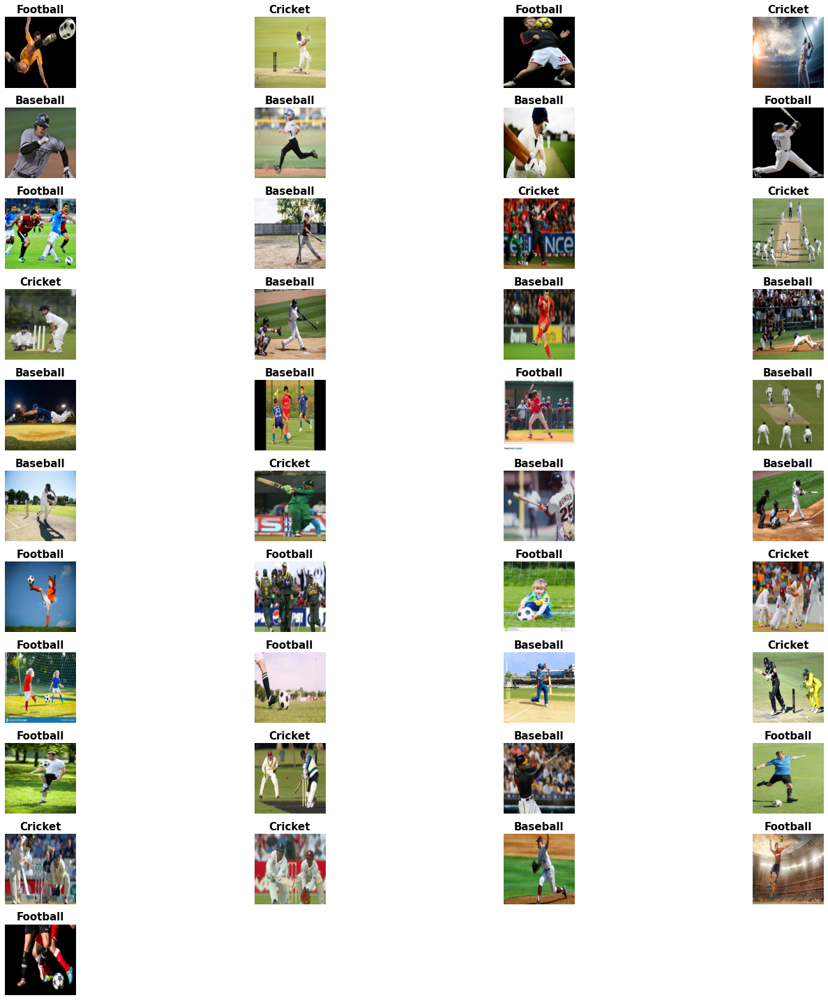

In [285]:
ncols = 4
nrows = math.ceil(test_pred.shape[0]/ncols)

 
plt.figure(figsize=(20,20))

for i,lab in enumerate(test_pred):
    plt.subplot(nrows,ncols,i+1)
    plt.imshow(list_test_images[i])
    plt.title(class_labels[np.argmax(lab)],fontsize=15,weight="bold")
    plt.axis('off')
plt.tight_layout()
plt.show() 

In [286]:
predicted_labels = []
for i in range(0,test_pred.shape[0]):
  label = np.argmax(test_pred[i])
  name = class_labels[label]
  predicted_labels.append([label,name])
  print(label,name) 


2 Football
1 Cricket
2 Football
1 Cricket
0 Baseball
0 Baseball
0 Baseball
2 Football
2 Football
0 Baseball
1 Cricket
1 Cricket
1 Cricket
0 Baseball
0 Baseball
0 Baseball
0 Baseball
0 Baseball
2 Football
0 Baseball
0 Baseball
1 Cricket
0 Baseball
0 Baseball
2 Football
2 Football
2 Football
1 Cricket
2 Football
2 Football
0 Baseball
1 Cricket
2 Football
1 Cricket
0 Baseball
2 Football
1 Cricket
1 Cricket
0 Baseball
2 Football
2 Football


In [309]:
#save the data to file 
with open('predicted_clases.csv', 'w',) as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Label', 'Name'])
    for label,name in predicted_labels:
        writer.writerow([label, name])